# TLDI2: Tea Leave Disease Identifier 2

``` json
{
    "info": {
        "version": "v1.5.0",
        "task": "classification",
        "m": 885
    }
}
```

## Data
Source: [Kaggle](https://www.kaggle.com/datasets/shashwatwork/identifying-disease-in-tea-leafs)

```
kaggle datasets download -d shashwatwork/identifying-disease-in-tea-leafs
```

### Citation
> None

## Importing Dependencies

In [2]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
try:
    import numpy as np
    import pandas as pd
    import os
    import shutil
    from zipfile import ZipFile
    import zipfile
    import splitfolders
    import random
    import time

    # ANN dependencies
    import tensorflow as tf
    import keras

    from keras import Sequential
    
    from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Dense
    from keras.layers import Flatten, ZeroPadding2D, BatchNormalization, Activation
    from keras.layers import Add, Input, Dropout, GlobalAveragePooling2D
    from keras.optimizers import SGD

    from keras.models import Model
    from keras.applications import ResNet152V2

    from tensorflow.keras.utils import load_img
    from tensorflow.keras.utils import img_to_array
    from keras.utils.vis_utils import plot_model

    from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau 

    import matplotlib
    import matplotlib.pyplot as plt
    from IPython.display import display

    matplotlib.style.use("ggplot")
    %matplotlib inline
    %config InlineBackend.figure_format = "retina"

    print(f"Using tensorflow v{tf.__version__}")
    print(f"Using keras v{keras.__version__}")
    print(f"Using matplotlib v{matplotlib.__version__}")
except Exception:
    import sys
    exc_type, exc_obj, exc_tb = sys.exc_info()
    raise Exception(f"error on importing dependencies! Error on line: {exc_tb.tb_lineno}")
finally:
    print(f"Success on importing dependencies!")

Using tensorflow v2.9.2
Using keras v2.9.0
Using matplotlib v3.2.2
Success on importing dependencies!


In [4]:
from google.colab import files


class utils:
    def kaggle(token_path: str, datasets=None, copy=True):
        root_dir = "/root/.kaggle"
        file_name = "kaggle.json"
        file_loc = os.path.join(root_dir, file_name)

        if not os.path.isdir(root_dir):
            os.mkdir(root_dir)

        if copy:
            shutil.copy(token_path, root_dir)
            status = "copied"
        else:
            shutil.move(token_path, root_dir)
            status = "moved"

        os.chmod(file_loc, 600)
        print(f"'kaggle.json' file have been {status} to {file_loc}!")

        if datasets is not None:
            from kaggle.api.kaggle_api_extended import KaggleApi

            api = KaggleApi()
            api.authenticate()

            if type(datasets) == str:
                datasets = [datasets]

            for dataset in datasets:
                api.dataset_download_cli(dataset)

            print(f"\nDataset has been successfully downloaded!")

    def unzip(path: str, output_dir: str, del_src=False):
        with ZipFile(path, "r") as zf:
            zf.extractall(output_dir)

        print(f"'{path}' has been extracted!")

        if del_src:
            os.remove(path)

## Getting the Data

In [5]:
from google.colab import drive

drive.mount("/content/gdrive")

drivebase = "/content/gdrive/MyDrive"
utils.kaggle(token_path=os.path.join(drivebase, "api_identifiers", "kaggle.json"),
             datasets="shashwatwork/identifying-disease-in-tea-leafs")

Mounted at /content/gdrive
'kaggle.json' file have been copied to /root/.kaggle/kaggle.json!


100%|██████████| 740M/740M [00:52<00:00, 14.9MB/s]



Dataset has been successfully downloaded!


In [6]:
utils.unzip(path="/content/identifying-disease-in-tea-leafs.zip", output_dir="/content")

'/content/identifying-disease-in-tea-leafs.zip' has been extracted!


## Data Preparation

In [7]:
def normalize_dir(parent_dir: str):
    for dir_name in os.listdir(parent_dir):
        new_dir_name = dir_name.replace(" ", "_")
        new_dir_name = new_dir_name.lower()

        os.rename(os.path.join(parent_dir, dir_name), os.path.join(parent_dir, new_dir_name))

def data_count(parent_dir: str, plot=True):
    data_lengths = dict()

    for subdir in os.listdir(parent_dir):
        data_lengths[subdir] = len(os.listdir(os.path.join(parent_dir, subdir)))

    return data_lengths

def img_samples(parent_dir: str, n_samples: int):
    random_images = list()

    for dir in os.listdir(parent_dir):
        dir_images = os.listdir(os.path.join(parent_dir, dir))

        for index in range(n_samples):
            random_images.append(os.path.join(parent_dir, dir, dir_images[random.randint(0, len(dir_images)-1)]))

    return random_images

def display_imgs(image_paths: list, rows: int, cols: int, figsize=(10, 5)):
    fig = plt.figure(figsize=figsize)

    for i in range(1, len(image_paths)+1):
        image = load_img(image_paths[i-1])
        image_array = img_to_array(image)
        class_id = image_paths[i-1].split("/")[3]

        fig.add_subplot(rows, cols, i)
        plt.title(f"{class_id}\n{image_array.shape}")
        plt.imshow(image)

In [8]:
dataset_base = "/content/dataset"
os.rename("/content/tea sickness dataset", dataset_base)

In [9]:
normalize_dir(dataset_base)

count = data_count(dataset_base)
count = pd.DataFrame(count.values(), index=count.keys(), columns=["count"])

display(count)

,count
brown_blight,113
bird_eye_spot,100
gray_light,100
anthracnose,100
algal_leaf,113
red_leaf_spot,143
healthy,74
white_spot,142


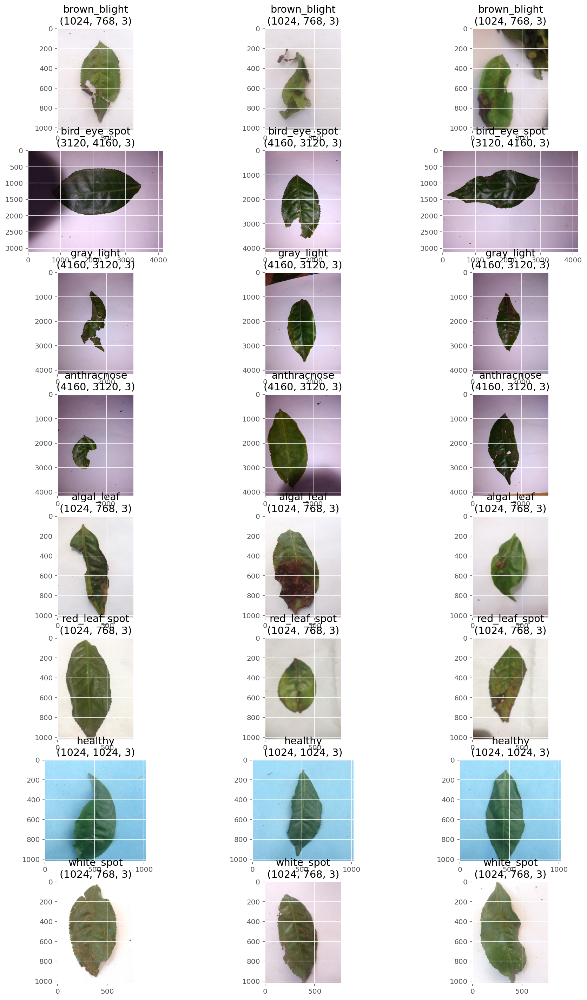

In [10]:
samples = img_samples(dataset_base, 3)

display_imgs(samples, rows=8, cols=3, figsize=(15, 25))

In [11]:
splitfolders.ratio(
    dataset_base,
    output="main_dataset",
    seed=2345, ratio=(.8, .1, .1),
    move=False
)

Copying files: 885 files [00:02, 341.24 files/s]


In [12]:
dataset_base = os.path.join(os.getcwd(), "main_dataset")

In [13]:
train_dir = os.path.join(dataset_base, "train")
val_dir = os.path.join(dataset_base, "val")
test_dir = os.path.join(dataset_base, "test")

In [14]:
for subdir in os.listdir(test_dir):
    subdir_path = os.path.join(test_dir, subdir)
    images = os.listdir(subdir_path)

    print(subdir)
    
    for index in range(0, len(images)-10):
        image_path = os.path.join(subdir_path, images[index])
        
        print(f"moving image \"{image_path}\"")
        shutil.move(image_path, os.path.join(val_dir, subdir))
        print(f"success!")

brown_blight
moving image "/content/main_dataset/test/brown_blight/UNADJUSTEDNONRAW_thumb_144.jpg"
success!
moving image "/content/main_dataset/test/brown_blight/UNADJUSTEDNONRAW_thumb_141.jpg"
success!
bird_eye_spot
gray_light
anthracnose
algal_leaf
moving image "/content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_3f.jpg"
success!
moving image "/content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_33.jpg"
success!
red_leaf_spot
moving image "/content/main_dataset/test/red_leaf_spot/UNADJUSTEDNONRAW_thumb_185.jpg"
success!
moving image "/content/main_dataset/test/red_leaf_spot/UNADJUSTEDNONRAW_thumb_1d5.jpg"
success!
moving image "/content/main_dataset/test/red_leaf_spot/UNADJUSTEDNONRAW_thumb_1b9.jpg"
success!
moving image "/content/main_dataset/test/red_leaf_spot/UNADJUSTEDNONRAW_thumb_1ac.jpg"
success!
moving image "/content/main_dataset/test/red_leaf_spot/UNADJUSTEDNONRAW_thumb_1e2.jpg"
success!
healthy
white_spot
moving image "/content/main_dataset/test/white_spot/

### Data Preprocessing

In [15]:
IMG_SIZE = (224, 224)
INPUT_SHAPE = (224, 224, 3)
TRAIN_BATCH = 128
VAL_BATCH = 128

In [16]:
train = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    seed=321,
    image_size=IMG_SIZE,
    batch_size=TRAIN_BATCH,
    label_mode="categorical"
)

Found 706 files belonging to 8 classes.


In [17]:
val = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    seed=321,
    image_size=IMG_SIZE,
    batch_size=VAL_BATCH,
    label_mode="categorical"
)

Found 101 files belonging to 8 classes.


In [18]:
classes = train.class_names
print(classes)

['algal_leaf', 'anthracnose', 'bird_eye_spot', 'brown_blight', 'gray_light', 'healthy', 'red_leaf_spot', 'white_spot']


In [19]:
AUTOTUNE = tf.data.AUTOTUNE

train = train.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val = val.cache().prefetch(buffer_size=AUTOTUNE)

## Modelling

### Basic Functions (callback and eval)

In [45]:
class LimitTrainingTime(tf.keras.callbacks.Callback):
    def __init__(self, max_time_s):
        super().__init__()
        self.max_time_s = max_time_s
        self.start_time = None

    def on_train_begin(self, logs):
        self.start_time = time.time()

    def on_train_batch_end(self, batch, logs):
        now = time.time()
        if now - self.start_time >  self.max_time_s:
            self.model.stop_training = True

class AccuracyCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
        if(logs.get("categorical_accuracy")>0.9):
            self.model.stop_training = True


early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_categorical_accuracy", verbose=1, patience=7, mode="auto")
reduce_lr = ReduceLROnPlateau(monitor="val_categorical_accuracy", verbose=1, patience=5, min_lr=0.001)
checkpoint = ModelCheckpoint(filepath="/content", monitor="val_categorical_accuracy", verbose=1, save_best_only=True)

acc_callback = AccuracyCallback()
time_callback = LimitTrainingTime(45*60)

In [21]:
def tldi2_predict(model, test_dir, classes, raw_pred=True, display_img=True):
    clss = os.listdir(test_dir)
    random_class = clss[random.randint(0, len(clss)-1)]
    images = os.listdir(os.path.join(test_dir, random_class))

    random_img = images[random.randint(0, len(images)-1)]
    random_img = os.path.join(test_dir, random_class, random_img)

    loaded_img = load_img(random_img, target_size=(224, 224))

    if display_img:
        plt.figure()
        plt.imshow(loaded_img)
        plt.colorbar()
        plt.grid(False)
        plt.show()

        print("\n")

    loaded_img = img_to_array(loaded_img)
    loaded_img = np.expand_dims(loaded_img, axis=0)

    y_hat = model.predict(np.vstack([loaded_img]))

    if raw_pred:
        print(f"prediction: {y_hat}")

    y_hat_class = classes[np.argmax(y_hat)]

    print(f"true_class: {random_class}",
          f"\nprediction_class: {y_hat_class}",
          f"\n\nreal_img_path: {random_img}")
    
    return (raw_pred, y_hat_class, random_class, random_img)

In [50]:
def zipdir(path, ziph):
    for root, dirs, files in os.walk(path):
        for file in files:
            ziph.write(os.path.join(root, file), 
                       os.path.relpath(os.path.join(root, file), 
                                       os.path.join(path, "..")))

## Defining and Training

### Custom CNN Architecture 

#### Training

In [34]:
def define_model():
    augmentation = Sequential([
        keras.layers.RandomFlip("horizontal", input_shape=INPUT_SHAPE),
        keras.layers.RandomFlip("vertical"),
        keras.layers.RandomRotation(0.2),
        keras.layers.RandomZoom(0.2)
    ])

    model = Sequential([
        augmentation,
        keras.layers.Rescaling(1./255),
        Conv2D(64, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Dropout(0.2),
        Conv2D(64, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Dropout(0.2),
        Conv2D(128, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Dropout(0.2),
        Conv2D(128, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Dropout(0.2),
        Flatten(),
        Dense(64, activation="relu", kernel_initializer="he_uniform"),
        Dropout(0.2),
        Dense(128, activation="relu", kernel_initializer="he_uniform"),
        BatchNormalization(),
        Dense(64, activation="relu", kernel_initializer="he_uniform"),
        Dropout(0.2),
        BatchNormalization(),
        Dense(8, activation="softmax")
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(0.0005),
                  loss=keras.losses.CategoricalCrossentropy(),
                  metrics=[keras.metrics.CategoricalAccuracy()])
    
    print("\n")
    model.summary()
    print("\n")
    
    plot_model(model, to_file="model_architecture.png", show_shapes=True, show_layer_names=True)

    return model

In [28]:
model_1 = define_model()
history_1 = model_1.fit(train,
                      validation_data=val,
                      epochs=200,
                      verbose=1,
                      callbacks=[checkpoint, acc_callback])



Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_4 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 112, 112, 64)     0         
 2D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 112, 112, 64)      0         
                                                                 
 conv2d_9 (Conv2D)           (None, 112, 112, 64)      36928     
                                                    

6/6 [==============================] - 4s 478ms/step - loss: 2.6836 - categorical_accuracy: 0.1431 - val_loss: 7.1997 - val_categorical_accuracy: 0.0990
Epoch 2/200
6/6 [==============================] - ETA: 0s - loss: 2.5843 - categorical_accuracy: 0.1402

6/6 [==============================] - 3s 430ms/step - loss: 2.5843 - categorical_accuracy: 0.1402 - val_loss: 4.3298 - val_categorical_accuracy: 0.0990
Epoch 3/200
6/6 [==============================] - ETA: 0s - loss: 2.5007 - categorical_accuracy: 0.1346

6/6 [==============================] - 3s 429ms/step - loss: 2.5007 - categorical_accuracy: 0.1346 - val_loss: 3.3399 - val_categorical_accuracy: 0.1287
Epoch 4/200
6/6 [==============================] - ETA: 0s - loss: 2.5317 - categorical_accuracy: 0.1374

6/6 [==============================] - 3s 427ms/step - loss: 2.5317 - categorical_accuracy: 0.1374 - val_loss: 2.6232 - val_categorical_accuracy: 0.1287
Epoch 5/200
6/6 [==============================] - ETA: 0s - loss: 2.4004 - categorical_accuracy: 0.1431

6/6 [==============================] - 3s 427ms/step - loss: 2.4004 - categorical_accuracy: 0.1431 - val_loss: 2.3249 - val_categorical_accuracy: 0.1287
Epoch 6/200
6/6 [==============================] - ETA: 0s - loss: 2.3649 - categorical_accuracy: 0.1601

6/6 [==============================] - 3s 438ms/step - loss: 2.3649 - categorical_accuracy: 0.1601 - val_loss: 2.1645 - val_categorical_accuracy: 0.1287
Epoch 7/200
6/6 [==============================] - ETA: 0s - loss: 2.3138 - categorical_accuracy: 0.1487

6/6 [==============================] - 3s 465ms/step - loss: 2.3138 - categorical_accuracy: 0.1487 - val_loss: 2.0521 - val_categorical_accuracy: 0.1287
Epoch 8/200
6/6 [==============================] - ETA: 0s - loss: 2.2520 - categorical_accuracy: 0.1742

6/6 [==============================] - 3s 432ms/step - loss: 2.2520 - categorical_accuracy: 0.1742 - val_loss: 1.9591 - val_categorical_accuracy: 0.1782
Epoch 9/200
6/6 [==============================] - ETA: 0s - loss: 2.2298 - categorical_accuracy: 0.1941

6/6 [==============================] - 3s 426ms/step - loss: 2.2298 - categorical_accuracy: 0.1941 - val_loss: 1.8743 - val_categorical_accuracy: 0.2574
Epoch 10/200
6/6 [==============================] - ETA: 0s - loss: 2.1469 - categorical_accuracy: 0.1941

6/6 [==============================] - 3s 428ms/step - loss: 2.1469 - categorical_accuracy: 0.1941 - val_loss: 1.8366 - val_categorical_accuracy: 0.2772
Epoch 11/200
6/6 [==============================] - ETA: 0s - loss: 2.1375 - categorical_accuracy: 0.2025

6/6 [==============================] - 3s 471ms/step - loss: 2.1375 - categorical_accuracy: 0.2025 - val_loss: 1.9761 - val_categorical_accuracy: 0.1188
Epoch 12/200
6/6 [==============================] - ETA: 0s - loss: 2.0861 - categorical_accuracy: 0.2040

6/6 [==============================] - 3s 432ms/step - loss: 2.0861 - categorical_accuracy: 0.2040 - val_loss: 2.4039 - val_categorical_accuracy: 0.0990
Epoch 13/200
6/6 [==============================] - ETA: 0s - loss: 2.0247 - categorical_accuracy: 0.2238

6/6 [==============================] - 3s 429ms/step - loss: 2.0247 - categorical_accuracy: 0.2238 - val_loss: 2.8633 - val_categorical_accuracy: 0.0990
Epoch 14/200
6/6 [==============================] - ETA: 0s - loss: 1.9041 - categorical_accuracy: 0.2550

6/6 [==============================] - 3s 431ms/step - loss: 1.9041 - categorical_accuracy: 0.2550 - val_loss: 3.4274 - val_categorical_accuracy: 0.0990
Epoch 15/200
6/6 [==============================] - ETA: 0s - loss: 1.8347 - categorical_accuracy: 0.2734

6/6 [==============================] - 3s 438ms/step - loss: 1.8347 - categorical_accuracy: 0.2734 - val_loss: 4.4929 - val_categorical_accuracy: 0.0990
Epoch 16/200
6/6 [==============================] - ETA: 0s - loss: 1.8151 - categorical_accuracy: 0.2649

6/6 [==============================] - 3s 478ms/step - loss: 1.8151 - categorical_accuracy: 0.2649 - val_loss: 4.6190 - val_categorical_accuracy: 0.0990
Epoch 17/200
6/6 [==============================] - ETA: 0s - loss: 1.7817 - categorical_accuracy: 0.2663

6/6 [==============================] - 3s 479ms/step - loss: 1.7817 - categorical_accuracy: 0.2663 - val_loss: 4.7339 - val_categorical_accuracy: 0.0990
Epoch 18/200
6/6 [==============================] - ETA: 0s - loss: 1.6962 - categorical_accuracy: 0.2677

6/6 [==============================] - 3s 480ms/step - loss: 1.6962 - categorical_accuracy: 0.2677 - val_loss: 5.2052 - val_categorical_accuracy: 0.0990
Epoch 19/200
6/6 [==============================] - ETA: 0s - loss: 1.7338 - categorical_accuracy: 0.2790

6/6 [==============================] - 3s 431ms/step - loss: 1.7338 - categorical_accuracy: 0.2790 - val_loss: 3.9797 - val_categorical_accuracy: 0.0990
Epoch 20/200
6/6 [==============================] - ETA: 0s - loss: 1.6114 - categorical_accuracy: 0.3215

6/6 [==============================] - 3s 491ms/step - loss: 1.6114 - categorical_accuracy: 0.3215 - val_loss: 5.1815 - val_categorical_accuracy: 0.0990
Epoch 21/200
6/6 [==============================] - ETA: 0s - loss: 1.5741 - categorical_accuracy: 0.3173

6/6 [==============================] - 3s 430ms/step - loss: 1.5741 - categorical_accuracy: 0.3173 - val_loss: 4.0537 - val_categorical_accuracy: 0.0990
Epoch 22/200
6/6 [==============================] - ETA: 0s - loss: 1.5875 - categorical_accuracy: 0.3258

6/6 [==============================] - 3s 431ms/step - loss: 1.5875 - categorical_accuracy: 0.3258 - val_loss: 5.2570 - val_categorical_accuracy: 0.1089
Epoch 23/200
6/6 [==============================] - ETA: 0s - loss: 1.4859 - categorical_accuracy: 0.3513

6/6 [==============================] - 3s 431ms/step - loss: 1.4859 - categorical_accuracy: 0.3513 - val_loss: 3.8610 - val_categorical_accuracy: 0.0990
Epoch 24/200
6/6 [==============================] - ETA: 0s - loss: 1.5107 - categorical_accuracy: 0.3598

6/6 [==============================] - 3s 429ms/step - loss: 1.5107 - categorical_accuracy: 0.3598 - val_loss: 4.9381 - val_categorical_accuracy: 0.0990
Epoch 25/200
6/6 [==============================] - ETA: 0s - loss: 1.4353 - categorical_accuracy: 0.3640

6/6 [==============================] - 3s 431ms/step - loss: 1.4353 - categorical_accuracy: 0.3640 - val_loss: 5.1736 - val_categorical_accuracy: 0.1089
Epoch 26/200
6/6 [==============================] - ETA: 0s - loss: 1.4271 - categorical_accuracy: 0.3867

6/6 [==============================] - 3s 426ms/step - loss: 1.4271 - categorical_accuracy: 0.3867 - val_loss: 4.0555 - val_categorical_accuracy: 0.1386
Epoch 27/200
6/6 [==============================] - ETA: 0s - loss: 1.3521 - categorical_accuracy: 0.3938

6/6 [==============================] - 3s 430ms/step - loss: 1.3521 - categorical_accuracy: 0.3938 - val_loss: 4.9571 - val_categorical_accuracy: 0.0990
Epoch 28/200
6/6 [==============================] - ETA: 0s - loss: 1.2526 - categorical_accuracy: 0.4405

6/6 [==============================] - 3s 469ms/step - loss: 1.2526 - categorical_accuracy: 0.4405 - val_loss: 4.9861 - val_categorical_accuracy: 0.0990
Epoch 29/200
6/6 [==============================] - ETA: 0s - loss: 1.2518 - categorical_accuracy: 0.4518

6/6 [==============================] - 3s 430ms/step - loss: 1.2518 - categorical_accuracy: 0.4518 - val_loss: 4.9956 - val_categorical_accuracy: 0.1089
Epoch 30/200
6/6 [==============================] - ETA: 0s - loss: 1.2398 - categorical_accuracy: 0.4391

6/6 [==============================] - 3s 433ms/step - loss: 1.2398 - categorical_accuracy: 0.4391 - val_loss: 5.2077 - val_categorical_accuracy: 0.1386
Epoch 31/200
6/6 [==============================] - ETA: 0s - loss: 1.2455 - categorical_accuracy: 0.4603

6/6 [==============================] - 3s 432ms/step - loss: 1.2455 - categorical_accuracy: 0.4603 - val_loss: 3.8722 - val_categorical_accuracy: 0.1386
Epoch 32/200
6/6 [==============================] - ETA: 0s - loss: 1.2583 - categorical_accuracy: 0.4363

6/6 [==============================] - 3s 427ms/step - loss: 1.2583 - categorical_accuracy: 0.4363 - val_loss: 5.2034 - val_categorical_accuracy: 0.1089
Epoch 33/200
6/6 [==============================] - ETA: 0s - loss: 1.2023 - categorical_accuracy: 0.4887

6/6 [==============================] - 3s 429ms/step - loss: 1.2023 - categorical_accuracy: 0.4887 - val_loss: 4.3321 - val_categorical_accuracy: 0.1089
Epoch 34/200
6/6 [==============================] - ETA: 0s - loss: 1.2211 - categorical_accuracy: 0.4745

6/6 [==============================] - 3s 429ms/step - loss: 1.2211 - categorical_accuracy: 0.4745 - val_loss: 4.3193 - val_categorical_accuracy: 0.0990
Epoch 35/200
6/6 [==============================] - ETA: 0s - loss: 1.1608 - categorical_accuracy: 0.4915

6/6 [==============================] - 3s 433ms/step - loss: 1.1608 - categorical_accuracy: 0.4915 - val_loss: 5.2257 - val_categorical_accuracy: 0.1089
Epoch 36/200
6/6 [==============================] - ETA: 0s - loss: 1.1457 - categorical_accuracy: 0.4972

6/6 [==============================] - 3s 468ms/step - loss: 1.1457 - categorical_accuracy: 0.4972 - val_loss: 5.3602 - val_categorical_accuracy: 0.0990
Epoch 37/200
6/6 [==============================] - ETA: 0s - loss: 1.1375 - categorical_accuracy: 0.4929

6/6 [==============================] - 3s 476ms/step - loss: 1.1375 - categorical_accuracy: 0.4929 - val_loss: 4.7969 - val_categorical_accuracy: 0.1089
Epoch 38/200
6/6 [==============================] - ETA: 0s - loss: 1.1131 - categorical_accuracy: 0.5085

6/6 [==============================] - 3s 429ms/step - loss: 1.1131 - categorical_accuracy: 0.5085 - val_loss: 4.9124 - val_categorical_accuracy: 0.1089
Epoch 39/200
6/6 [==============================] - ETA: 0s - loss: 1.0981 - categorical_accuracy: 0.4958

6/6 [==============================] - 3s 426ms/step - loss: 1.0981 - categorical_accuracy: 0.4958 - val_loss: 4.9402 - val_categorical_accuracy: 0.0990
Epoch 40/200
6/6 [==============================] - ETA: 0s - loss: 1.0565 - categorical_accuracy: 0.5326

6/6 [==============================] - 3s 431ms/step - loss: 1.0565 - categorical_accuracy: 0.5326 - val_loss: 3.8120 - val_categorical_accuracy: 0.1188
Epoch 41/200
6/6 [==============================] - ETA: 0s - loss: 1.0519 - categorical_accuracy: 0.5255

6/6 [==============================] - 3s 427ms/step - loss: 1.0519 - categorical_accuracy: 0.5255 - val_loss: 4.1700 - val_categorical_accuracy: 0.1386
Epoch 42/200
6/6 [==============================] - ETA: 0s - loss: 1.0299 - categorical_accuracy: 0.5212

6/6 [==============================] - 3s 429ms/step - loss: 1.0299 - categorical_accuracy: 0.5212 - val_loss: 4.7981 - val_categorical_accuracy: 0.1188
Epoch 43/200
6/6 [==============================] - ETA: 0s - loss: 1.0497 - categorical_accuracy: 0.5184

6/6 [==============================] - 3s 428ms/step - loss: 1.0497 - categorical_accuracy: 0.5184 - val_loss: 3.9409 - val_categorical_accuracy: 0.1386
Epoch 44/200
6/6 [==============================] - ETA: 0s - loss: 0.9987 - categorical_accuracy: 0.5609

6/6 [==============================] - 3s 428ms/step - loss: 0.9987 - categorical_accuracy: 0.5609 - val_loss: 4.5758 - val_categorical_accuracy: 0.1287
Epoch 45/200
6/6 [==============================] - ETA: 0s - loss: 0.9625 - categorical_accuracy: 0.5722

6/6 [==============================] - 3s 432ms/step - loss: 0.9625 - categorical_accuracy: 0.5722 - val_loss: 4.2648 - val_categorical_accuracy: 0.1188
Epoch 46/200
6/6 [==============================] - ETA: 0s - loss: 0.9455 - categorical_accuracy: 0.5822

6/6 [==============================] - 3s 439ms/step - loss: 0.9455 - categorical_accuracy: 0.5822 - val_loss: 4.1363 - val_categorical_accuracy: 0.1089
Epoch 47/200
6/6 [==============================] - ETA: 0s - loss: 0.9125 - categorical_accuracy: 0.6091

6/6 [==============================] - 3s 432ms/step - loss: 0.9125 - categorical_accuracy: 0.6091 - val_loss: 3.7240 - val_categorical_accuracy: 0.1089
Epoch 48/200
6/6 [==============================] - ETA: 0s - loss: 0.9373 - categorical_accuracy: 0.5822

6/6 [==============================] - 3s 432ms/step - loss: 0.9373 - categorical_accuracy: 0.5822 - val_loss: 3.7896 - val_categorical_accuracy: 0.1386
Epoch 49/200
6/6 [==============================] - ETA: 0s - loss: 0.9371 - categorical_accuracy: 0.6034

6/6 [==============================] - 3s 430ms/step - loss: 0.9371 - categorical_accuracy: 0.6034 - val_loss: 3.5200 - val_categorical_accuracy: 0.1386
Epoch 50/200
6/6 [==============================] - ETA: 0s - loss: 0.9608 - categorical_accuracy: 0.5892

6/6 [==============================] - 3s 435ms/step - loss: 0.9608 - categorical_accuracy: 0.5892 - val_loss: 3.1507 - val_categorical_accuracy: 0.1386
Epoch 51/200
6/6 [==============================] - ETA: 0s - loss: 0.8960 - categorical_accuracy: 0.6346

6/6 [==============================] - 3s 430ms/step - loss: 0.8960 - categorical_accuracy: 0.6346 - val_loss: 3.3861 - val_categorical_accuracy: 0.1485
Epoch 52/200
6/6 [==============================] - ETA: 0s - loss: 0.9245 - categorical_accuracy: 0.5822

6/6 [==============================] - 3s 429ms/step - loss: 0.9245 - categorical_accuracy: 0.5822 - val_loss: 3.9522 - val_categorical_accuracy: 0.1782
Epoch 53/200
6/6 [==============================] - ETA: 0s - loss: 0.9240 - categorical_accuracy: 0.5892

6/6 [==============================] - 3s 468ms/step - loss: 0.9240 - categorical_accuracy: 0.5892 - val_loss: 3.1980 - val_categorical_accuracy: 0.1386
Epoch 54/200
6/6 [==============================] - ETA: 0s - loss: 0.9022 - categorical_accuracy: 0.6006

6/6 [==============================] - 3s 429ms/step - loss: 0.9022 - categorical_accuracy: 0.6006 - val_loss: 2.8517 - val_categorical_accuracy: 0.1386
Epoch 55/200
6/6 [==============================] - ETA: 0s - loss: 0.9019 - categorical_accuracy: 0.5892

6/6 [==============================] - 3s 428ms/step - loss: 0.9019 - categorical_accuracy: 0.5892 - val_loss: 3.3434 - val_categorical_accuracy: 0.1485
Epoch 56/200
6/6 [==============================] - ETA: 0s - loss: 0.8520 - categorical_accuracy: 0.6275

6/6 [==============================] - 3s 427ms/step - loss: 0.8520 - categorical_accuracy: 0.6275 - val_loss: 3.3789 - val_categorical_accuracy: 0.1584
Epoch 57/200
6/6 [==============================] - ETA: 0s - loss: 0.8625 - categorical_accuracy: 0.6275

6/6 [==============================] - 3s 431ms/step - loss: 0.8625 - categorical_accuracy: 0.6275 - val_loss: 3.2023 - val_categorical_accuracy: 0.1287
Epoch 58/200
6/6 [==============================] - ETA: 0s - loss: 0.8204 - categorical_accuracy: 0.6416

6/6 [==============================] - 3s 472ms/step - loss: 0.8204 - categorical_accuracy: 0.6416 - val_loss: 2.7985 - val_categorical_accuracy: 0.1386
Epoch 59/200
6/6 [==============================] - ETA: 0s - loss: 0.8075 - categorical_accuracy: 0.6530

6/6 [==============================] - 3s 435ms/step - loss: 0.8075 - categorical_accuracy: 0.6530 - val_loss: 3.1019 - val_categorical_accuracy: 0.1386
Epoch 60/200
6/6 [==============================] - ETA: 0s - loss: 0.8305 - categorical_accuracy: 0.6473

6/6 [==============================] - 3s 474ms/step - loss: 0.8305 - categorical_accuracy: 0.6473 - val_loss: 3.0319 - val_categorical_accuracy: 0.1386
Epoch 61/200
6/6 [==============================] - ETA: 0s - loss: 0.8418 - categorical_accuracy: 0.6487

6/6 [==============================] - 3s 469ms/step - loss: 0.8418 - categorical_accuracy: 0.6487 - val_loss: 3.1572 - val_categorical_accuracy: 0.1485
Epoch 62/200
6/6 [==============================] - ETA: 0s - loss: 0.8427 - categorical_accuracy: 0.6388

6/6 [==============================] - 3s 430ms/step - loss: 0.8427 - categorical_accuracy: 0.6388 - val_loss: 2.7729 - val_categorical_accuracy: 0.1980
Epoch 63/200
6/6 [==============================] - ETA: 0s - loss: 0.8194 - categorical_accuracy: 0.6473

6/6 [==============================] - 3s 473ms/step - loss: 0.8194 - categorical_accuracy: 0.6473 - val_loss: 2.2374 - val_categorical_accuracy: 0.2178
Epoch 64/200
6/6 [==============================] - ETA: 0s - loss: 0.8275 - categorical_accuracy: 0.6431

6/6 [==============================] - 3s 429ms/step - loss: 0.8275 - categorical_accuracy: 0.6431 - val_loss: 2.9496 - val_categorical_accuracy: 0.1881
Epoch 65/200
6/6 [==============================] - ETA: 0s - loss: 0.8155 - categorical_accuracy: 0.6416

6/6 [==============================] - 3s 479ms/step - loss: 0.8155 - categorical_accuracy: 0.6416 - val_loss: 3.1425 - val_categorical_accuracy: 0.1584
Epoch 66/200
6/6 [==============================] - ETA: 0s - loss: 0.7811 - categorical_accuracy: 0.6615

6/6 [==============================] - 4s 594ms/step - loss: 0.7811 - categorical_accuracy: 0.6615 - val_loss: 2.6227 - val_categorical_accuracy: 0.1683
Epoch 67/200
6/6 [==============================] - ETA: 0s - loss: 0.8300 - categorical_accuracy: 0.6374

6/6 [==============================] - 3s 464ms/step - loss: 0.8300 - categorical_accuracy: 0.6374 - val_loss: 3.1217 - val_categorical_accuracy: 0.1782
Epoch 68/200
6/6 [==============================] - ETA: 0s - loss: 0.8229 - categorical_accuracy: 0.6487

6/6 [==============================] - 3s 429ms/step - loss: 0.8229 - categorical_accuracy: 0.6487 - val_loss: 2.8651 - val_categorical_accuracy: 0.2376
Epoch 69/200
6/6 [==============================] - ETA: 0s - loss: 0.7749 - categorical_accuracy: 0.6629

6/6 [==============================] - 3s 437ms/step - loss: 0.7749 - categorical_accuracy: 0.6629 - val_loss: 2.4009 - val_categorical_accuracy: 0.1782
Epoch 70/200
6/6 [==============================] - ETA: 0s - loss: 0.7629 - categorical_accuracy: 0.6813

6/6 [==============================] - 3s 431ms/step - loss: 0.7629 - categorical_accuracy: 0.6813 - val_loss: 3.1038 - val_categorical_accuracy: 0.1881
Epoch 71/200
6/6 [==============================] - ETA: 0s - loss: 0.7799 - categorical_accuracy: 0.6728

6/6 [==============================] - 3s 427ms/step - loss: 0.7799 - categorical_accuracy: 0.6728 - val_loss: 2.9140 - val_categorical_accuracy: 0.1881
Epoch 72/200
6/6 [==============================] - ETA: 0s - loss: 0.7429 - categorical_accuracy: 0.6955

6/6 [==============================] - 3s 426ms/step - loss: 0.7429 - categorical_accuracy: 0.6955 - val_loss: 3.1547 - val_categorical_accuracy: 0.1881
Epoch 73/200
6/6 [==============================] - ETA: 0s - loss: 0.7324 - categorical_accuracy: 0.7011

6/6 [==============================] - 3s 428ms/step - loss: 0.7324 - categorical_accuracy: 0.7011 - val_loss: 3.1898 - val_categorical_accuracy: 0.1782
Epoch 74/200
6/6 [==============================] - ETA: 0s - loss: 0.7429 - categorical_accuracy: 0.6813

6/6 [==============================] - 3s 430ms/step - loss: 0.7429 - categorical_accuracy: 0.6813 - val_loss: 2.8356 - val_categorical_accuracy: 0.2079
Epoch 75/200
6/6 [==============================] - ETA: 0s - loss: 0.7094 - categorical_accuracy: 0.7068

6/6 [==============================] - 3s 427ms/step - loss: 0.7094 - categorical_accuracy: 0.7068 - val_loss: 2.5540 - val_categorical_accuracy: 0.2970
Epoch 76/200
6/6 [==============================] - ETA: 0s - loss: 0.7397 - categorical_accuracy: 0.7054

6/6 [==============================] - 3s 467ms/step - loss: 0.7397 - categorical_accuracy: 0.7054 - val_loss: 2.8960 - val_categorical_accuracy: 0.2376
Epoch 77/200
6/6 [==============================] - ETA: 0s - loss: 0.7307 - categorical_accuracy: 0.7040

6/6 [==============================] - 3s 428ms/step - loss: 0.7307 - categorical_accuracy: 0.7040 - val_loss: 3.0001 - val_categorical_accuracy: 0.2475
Epoch 78/200
6/6 [==============================] - ETA: 0s - loss: 0.7306 - categorical_accuracy: 0.7025

6/6 [==============================] - 3s 441ms/step - loss: 0.7306 - categorical_accuracy: 0.7025 - val_loss: 3.2988 - val_categorical_accuracy: 0.2079
Epoch 79/200
6/6 [==============================] - ETA: 0s - loss: 0.7159 - categorical_accuracy: 0.7110

6/6 [==============================] - 3s 430ms/step - loss: 0.7159 - categorical_accuracy: 0.7110 - val_loss: 2.1546 - val_categorical_accuracy: 0.2970
Epoch 80/200
6/6 [==============================] - ETA: 0s - loss: 0.7791 - categorical_accuracy: 0.6799

6/6 [==============================] - 3s 426ms/step - loss: 0.7791 - categorical_accuracy: 0.6799 - val_loss: 2.5458 - val_categorical_accuracy: 0.2277
Epoch 81/200
6/6 [==============================] - ETA: 0s - loss: 0.7842 - categorical_accuracy: 0.6572

6/6 [==============================] - 3s 429ms/step - loss: 0.7842 - categorical_accuracy: 0.6572 - val_loss: 2.7555 - val_categorical_accuracy: 0.2277
Epoch 82/200
6/6 [==============================] - ETA: 0s - loss: 0.7940 - categorical_accuracy: 0.6487

6/6 [==============================] - 3s 474ms/step - loss: 0.7940 - categorical_accuracy: 0.6487 - val_loss: 2.4947 - val_categorical_accuracy: 0.2376
Epoch 83/200
6/6 [==============================] - ETA: 0s - loss: 0.7194 - categorical_accuracy: 0.6912

6/6 [==============================] - 3s 470ms/step - loss: 0.7194 - categorical_accuracy: 0.6912 - val_loss: 2.5020 - val_categorical_accuracy: 0.3267
Epoch 84/200
6/6 [==============================] - ETA: 0s - loss: 0.7082 - categorical_accuracy: 0.7153

6/6 [==============================] - 3s 476ms/step - loss: 0.7082 - categorical_accuracy: 0.7153 - val_loss: 2.9972 - val_categorical_accuracy: 0.2376
Epoch 85/200
6/6 [==============================] - ETA: 0s - loss: 0.7186 - categorical_accuracy: 0.6955

6/6 [==============================] - 3s 472ms/step - loss: 0.7186 - categorical_accuracy: 0.6955 - val_loss: 2.1697 - val_categorical_accuracy: 0.3069
Epoch 86/200
6/6 [==============================] - ETA: 0s - loss: 0.7168 - categorical_accuracy: 0.7153

6/6 [==============================] - 3s 431ms/step - loss: 0.7168 - categorical_accuracy: 0.7153 - val_loss: 2.5899 - val_categorical_accuracy: 0.2673
Epoch 87/200
6/6 [==============================] - ETA: 0s - loss: 0.6945 - categorical_accuracy: 0.7082

6/6 [==============================] - 3s 428ms/step - loss: 0.6945 - categorical_accuracy: 0.7082 - val_loss: 3.0265 - val_categorical_accuracy: 0.2277
Epoch 88/200
6/6 [==============================] - ETA: 0s - loss: 0.6898 - categorical_accuracy: 0.7139

6/6 [==============================] - 3s 435ms/step - loss: 0.6898 - categorical_accuracy: 0.7139 - val_loss: 2.3505 - val_categorical_accuracy: 0.2970
Epoch 89/200
6/6 [==============================] - ETA: 0s - loss: 0.7097 - categorical_accuracy: 0.6983

6/6 [==============================] - 3s 433ms/step - loss: 0.7097 - categorical_accuracy: 0.6983 - val_loss: 2.6556 - val_categorical_accuracy: 0.2277
Epoch 90/200
6/6 [==============================] - ETA: 0s - loss: 0.7274 - categorical_accuracy: 0.6785

6/6 [==============================] - 3s 431ms/step - loss: 0.7274 - categorical_accuracy: 0.6785 - val_loss: 2.8703 - val_categorical_accuracy: 0.3267
Epoch 91/200
6/6 [==============================] - ETA: 0s - loss: 0.7706 - categorical_accuracy: 0.6799

6/6 [==============================] - 3s 424ms/step - loss: 0.7706 - categorical_accuracy: 0.6799 - val_loss: 1.8879 - val_categorical_accuracy: 0.4356
Epoch 92/200
6/6 [==============================] - ETA: 0s - loss: 0.7365 - categorical_accuracy: 0.6912

6/6 [==============================] - 3s 432ms/step - loss: 0.7365 - categorical_accuracy: 0.6912 - val_loss: 2.2167 - val_categorical_accuracy: 0.3366
Epoch 93/200
6/6 [==============================] - ETA: 0s - loss: 0.7515 - categorical_accuracy: 0.6771

6/6 [==============================] - 3s 468ms/step - loss: 0.7515 - categorical_accuracy: 0.6771 - val_loss: 2.4245 - val_categorical_accuracy: 0.3168
Epoch 94/200
6/6 [==============================] - ETA: 0s - loss: 0.6876 - categorical_accuracy: 0.7025

6/6 [==============================] - 3s 429ms/step - loss: 0.6876 - categorical_accuracy: 0.7025 - val_loss: 2.3287 - val_categorical_accuracy: 0.2673
Epoch 95/200
6/6 [==============================] - ETA: 0s - loss: 0.6887 - categorical_accuracy: 0.6941

6/6 [==============================] - 3s 430ms/step - loss: 0.6887 - categorical_accuracy: 0.6941 - val_loss: 2.1352 - val_categorical_accuracy: 0.3663
Epoch 96/200
6/6 [==============================] - ETA: 0s - loss: 0.7123 - categorical_accuracy: 0.6983

6/6 [==============================] - 3s 428ms/step - loss: 0.7123 - categorical_accuracy: 0.6983 - val_loss: 2.6366 - val_categorical_accuracy: 0.3069
Epoch 97/200
6/6 [==============================] - ETA: 0s - loss: 0.6760 - categorical_accuracy: 0.7096

6/6 [==============================] - 3s 467ms/step - loss: 0.6760 - categorical_accuracy: 0.7096 - val_loss: 2.3432 - val_categorical_accuracy: 0.2574
Epoch 98/200
6/6 [==============================] - ETA: 0s - loss: 0.6862 - categorical_accuracy: 0.7139

6/6 [==============================] - 3s 426ms/step - loss: 0.6862 - categorical_accuracy: 0.7139 - val_loss: 2.3412 - val_categorical_accuracy: 0.3465
Epoch 99/200
6/6 [==============================] - ETA: 0s - loss: 0.6439 - categorical_accuracy: 0.7323

6/6 [==============================] - 3s 425ms/step - loss: 0.6439 - categorical_accuracy: 0.7323 - val_loss: 2.5903 - val_categorical_accuracy: 0.2376
Epoch 100/200
6/6 [==============================] - ETA: 0s - loss: 0.6476 - categorical_accuracy: 0.7422

6/6 [==============================] - 3s 473ms/step - loss: 0.6476 - categorical_accuracy: 0.7422 - val_loss: 2.2688 - val_categorical_accuracy: 0.3069
Epoch 101/200
6/6 [==============================] - ETA: 0s - loss: 0.6406 - categorical_accuracy: 0.7337

6/6 [==============================] - 3s 435ms/step - loss: 0.6406 - categorical_accuracy: 0.7337 - val_loss: 2.4103 - val_categorical_accuracy: 0.2475
Epoch 102/200
6/6 [==============================] - ETA: 0s - loss: 0.6017 - categorical_accuracy: 0.7465

6/6 [==============================] - 3s 433ms/step - loss: 0.6017 - categorical_accuracy: 0.7465 - val_loss: 2.5429 - val_categorical_accuracy: 0.3267
Epoch 103/200
6/6 [==============================] - ETA: 0s - loss: 0.6038 - categorical_accuracy: 0.7535

6/6 [==============================] - 3s 429ms/step - loss: 0.6038 - categorical_accuracy: 0.7535 - val_loss: 2.5107 - val_categorical_accuracy: 0.2673
Epoch 104/200
6/6 [==============================] - ETA: 0s - loss: 0.6141 - categorical_accuracy: 0.7309

6/6 [==============================] - 3s 467ms/step - loss: 0.6141 - categorical_accuracy: 0.7309 - val_loss: 2.5594 - val_categorical_accuracy: 0.3069
Epoch 105/200
6/6 [==============================] - ETA: 0s - loss: 0.6106 - categorical_accuracy: 0.7535

6/6 [==============================] - 3s 429ms/step - loss: 0.6106 - categorical_accuracy: 0.7535 - val_loss: 2.6994 - val_categorical_accuracy: 0.2376
Epoch 106/200
6/6 [==============================] - ETA: 0s - loss: 0.5883 - categorical_accuracy: 0.7564

6/6 [==============================] - 3s 469ms/step - loss: 0.5883 - categorical_accuracy: 0.7564 - val_loss: 2.9330 - val_categorical_accuracy: 0.2772
Epoch 107/200
6/6 [==============================] - ETA: 0s - loss: 0.6120 - categorical_accuracy: 0.7535

6/6 [==============================] - 3s 431ms/step - loss: 0.6120 - categorical_accuracy: 0.7535 - val_loss: 2.7690 - val_categorical_accuracy: 0.2673
Epoch 108/200
6/6 [==============================] - ETA: 0s - loss: 0.6018 - categorical_accuracy: 0.7365

6/6 [==============================] - 3s 430ms/step - loss: 0.6018 - categorical_accuracy: 0.7365 - val_loss: 2.5947 - val_categorical_accuracy: 0.2475
Epoch 109/200
6/6 [==============================] - ETA: 0s - loss: 0.5773 - categorical_accuracy: 0.7507

6/6 [==============================] - 3s 428ms/step - loss: 0.5773 - categorical_accuracy: 0.7507 - val_loss: 2.3406 - val_categorical_accuracy: 0.2871
Epoch 110/200
6/6 [==============================] - ETA: 0s - loss: 0.5656 - categorical_accuracy: 0.7649

6/6 [==============================] - 3s 431ms/step - loss: 0.5656 - categorical_accuracy: 0.7649 - val_loss: 2.8977 - val_categorical_accuracy: 0.2475
Epoch 111/200
6/6 [==============================] - ETA: 0s - loss: 0.6234 - categorical_accuracy: 0.7280

6/6 [==============================] - 3s 480ms/step - loss: 0.6234 - categorical_accuracy: 0.7280 - val_loss: 2.5183 - val_categorical_accuracy: 0.2376
Epoch 112/200
6/6 [==============================] - ETA: 0s - loss: 0.5674 - categorical_accuracy: 0.7762

6/6 [==============================] - 3s 435ms/step - loss: 0.5674 - categorical_accuracy: 0.7762 - val_loss: 2.1788 - val_categorical_accuracy: 0.3663
Epoch 113/200
6/6 [==============================] - ETA: 0s - loss: 0.6075 - categorical_accuracy: 0.7422

6/6 [==============================] - 3s 434ms/step - loss: 0.6075 - categorical_accuracy: 0.7422 - val_loss: 2.3212 - val_categorical_accuracy: 0.3168
Epoch 114/200
6/6 [==============================] - ETA: 0s - loss: 0.5709 - categorical_accuracy: 0.7691

6/6 [==============================] - 3s 434ms/step - loss: 0.5709 - categorical_accuracy: 0.7691 - val_loss: 3.0293 - val_categorical_accuracy: 0.2871
Epoch 115/200
6/6 [==============================] - ETA: 0s - loss: 0.6249 - categorical_accuracy: 0.7677

6/6 [==============================] - 3s 431ms/step - loss: 0.6249 - categorical_accuracy: 0.7677 - val_loss: 2.1682 - val_categorical_accuracy: 0.3366
Epoch 116/200
6/6 [==============================] - ETA: 0s - loss: 0.6184 - categorical_accuracy: 0.7521

6/6 [==============================] - 3s 432ms/step - loss: 0.6184 - categorical_accuracy: 0.7521 - val_loss: 2.5384 - val_categorical_accuracy: 0.2376
Epoch 117/200
6/6 [==============================] - ETA: 0s - loss: 0.5798 - categorical_accuracy: 0.7620

6/6 [==============================] - 3s 430ms/step - loss: 0.5798 - categorical_accuracy: 0.7620 - val_loss: 2.4648 - val_categorical_accuracy: 0.3168
Epoch 118/200
6/6 [==============================] - ETA: 0s - loss: 0.5982 - categorical_accuracy: 0.7606

6/6 [==============================] - 3s 424ms/step - loss: 0.5982 - categorical_accuracy: 0.7606 - val_loss: 2.1147 - val_categorical_accuracy: 0.3960
Epoch 119/200
6/6 [==============================] - ETA: 0s - loss: 0.5928 - categorical_accuracy: 0.7380

6/6 [==============================] - 3s 432ms/step - loss: 0.5928 - categorical_accuracy: 0.7380 - val_loss: 2.5627 - val_categorical_accuracy: 0.2673
Epoch 120/200
6/6 [==============================] - ETA: 0s - loss: 0.5653 - categorical_accuracy: 0.7677

6/6 [==============================] - 3s 425ms/step - loss: 0.5653 - categorical_accuracy: 0.7677 - val_loss: 2.2715 - val_categorical_accuracy: 0.3564
Epoch 121/200
6/6 [==============================] - ETA: 0s - loss: 0.5627 - categorical_accuracy: 0.7861

6/6 [==============================] - 3s 428ms/step - loss: 0.5627 - categorical_accuracy: 0.7861 - val_loss: 2.5047 - val_categorical_accuracy: 0.2673
Epoch 122/200
6/6 [==============================] - ETA: 0s - loss: 0.5658 - categorical_accuracy: 0.7535

6/6 [==============================] - 3s 430ms/step - loss: 0.5658 - categorical_accuracy: 0.7535 - val_loss: 2.4422 - val_categorical_accuracy: 0.3168
Epoch 123/200
6/6 [==============================] - ETA: 0s - loss: 0.5170 - categorical_accuracy: 0.7776

6/6 [==============================] - 3s 430ms/step - loss: 0.5170 - categorical_accuracy: 0.7776 - val_loss: 2.4320 - val_categorical_accuracy: 0.3366
Epoch 124/200
6/6 [==============================] - ETA: 0s - loss: 0.5426 - categorical_accuracy: 0.7748

6/6 [==============================] - 3s 465ms/step - loss: 0.5426 - categorical_accuracy: 0.7748 - val_loss: 2.7289 - val_categorical_accuracy: 0.2970
Epoch 125/200
6/6 [==============================] - ETA: 0s - loss: 0.6079 - categorical_accuracy: 0.7380

6/6 [==============================] - 3s 424ms/step - loss: 0.6079 - categorical_accuracy: 0.7380 - val_loss: 2.2938 - val_categorical_accuracy: 0.2871
Epoch 126/200
6/6 [==============================] - ETA: 0s - loss: 0.5647 - categorical_accuracy: 0.7677

6/6 [==============================] - 3s 431ms/step - loss: 0.5647 - categorical_accuracy: 0.7677 - val_loss: 2.3365 - val_categorical_accuracy: 0.2871
Epoch 127/200
6/6 [==============================] - ETA: 0s - loss: 0.5496 - categorical_accuracy: 0.7748

6/6 [==============================] - 3s 432ms/step - loss: 0.5496 - categorical_accuracy: 0.7748 - val_loss: 2.2434 - val_categorical_accuracy: 0.3564
Epoch 128/200
6/6 [==============================] - ETA: 0s - loss: 0.5368 - categorical_accuracy: 0.7861

6/6 [==============================] - 3s 426ms/step - loss: 0.5368 - categorical_accuracy: 0.7861 - val_loss: 2.5976 - val_categorical_accuracy: 0.3168
Epoch 129/200
6/6 [==============================] - ETA: 0s - loss: 0.5523 - categorical_accuracy: 0.7875

6/6 [==============================] - 3s 430ms/step - loss: 0.5523 - categorical_accuracy: 0.7875 - val_loss: 2.2523 - val_categorical_accuracy: 0.2970
Epoch 130/200
6/6 [==============================] - ETA: 0s - loss: 0.5156 - categorical_accuracy: 0.7932

6/6 [==============================] - 3s 432ms/step - loss: 0.5156 - categorical_accuracy: 0.7932 - val_loss: 2.3950 - val_categorical_accuracy: 0.2574
Epoch 131/200
6/6 [==============================] - ETA: 0s - loss: 0.5070 - categorical_accuracy: 0.7960

6/6 [==============================] - 3s 429ms/step - loss: 0.5070 - categorical_accuracy: 0.7960 - val_loss: 2.4208 - val_categorical_accuracy: 0.3168
Epoch 132/200
6/6 [==============================] - ETA: 0s - loss: 0.4872 - categorical_accuracy: 0.7918

6/6 [==============================] - 3s 434ms/step - loss: 0.4872 - categorical_accuracy: 0.7918 - val_loss: 2.6735 - val_categorical_accuracy: 0.2475
Epoch 133/200
6/6 [==============================] - ETA: 0s - loss: 0.5095 - categorical_accuracy: 0.7890

6/6 [==============================] - 3s 429ms/step - loss: 0.5095 - categorical_accuracy: 0.7890 - val_loss: 2.3241 - val_categorical_accuracy: 0.3465
Epoch 134/200
6/6 [==============================] - ETA: 0s - loss: 0.4919 - categorical_accuracy: 0.8144

6/6 [==============================] - 3s 431ms/step - loss: 0.4919 - categorical_accuracy: 0.8144 - val_loss: 2.6856 - val_categorical_accuracy: 0.2475
Epoch 135/200
6/6 [==============================] - ETA: 0s - loss: 0.4799 - categorical_accuracy: 0.8059

6/6 [==============================] - 3s 473ms/step - loss: 0.4799 - categorical_accuracy: 0.8059 - val_loss: 2.7243 - val_categorical_accuracy: 0.2475
Epoch 136/200
6/6 [==============================] - ETA: 0s - loss: 0.5068 - categorical_accuracy: 0.7989

6/6 [==============================] - 3s 431ms/step - loss: 0.5068 - categorical_accuracy: 0.7989 - val_loss: 2.2159 - val_categorical_accuracy: 0.3168
Epoch 137/200
6/6 [==============================] - ETA: 0s - loss: 0.5149 - categorical_accuracy: 0.7833

6/6 [==============================] - 3s 430ms/step - loss: 0.5149 - categorical_accuracy: 0.7833 - val_loss: 2.5075 - val_categorical_accuracy: 0.2574
Epoch 138/200
6/6 [==============================] - ETA: 0s - loss: 0.5199 - categorical_accuracy: 0.7861

6/6 [==============================] - 3s 429ms/step - loss: 0.5199 - categorical_accuracy: 0.7861 - val_loss: 2.8210 - val_categorical_accuracy: 0.2772
Epoch 139/200
6/6 [==============================] - ETA: 0s - loss: 0.5290 - categorical_accuracy: 0.7989

6/6 [==============================] - 3s 468ms/step - loss: 0.5290 - categorical_accuracy: 0.7989 - val_loss: 2.1604 - val_categorical_accuracy: 0.3861
Epoch 140/200
6/6 [==============================] - ETA: 0s - loss: 0.5384 - categorical_accuracy: 0.7904

6/6 [==============================] - 3s 430ms/step - loss: 0.5384 - categorical_accuracy: 0.7904 - val_loss: 2.0634 - val_categorical_accuracy: 0.3663
Epoch 141/200
6/6 [==============================] - ETA: 0s - loss: 0.4863 - categorical_accuracy: 0.8003

6/6 [==============================] - 3s 472ms/step - loss: 0.4863 - categorical_accuracy: 0.8003 - val_loss: 2.7091 - val_categorical_accuracy: 0.2772
Epoch 142/200
6/6 [==============================] - ETA: 0s - loss: 0.4786 - categorical_accuracy: 0.8116

6/6 [==============================] - 3s 425ms/step - loss: 0.4786 - categorical_accuracy: 0.8116 - val_loss: 2.5217 - val_categorical_accuracy: 0.3069
Epoch 143/200
6/6 [==============================] - ETA: 0s - loss: 0.4845 - categorical_accuracy: 0.8045

6/6 [==============================] - 3s 430ms/step - loss: 0.4845 - categorical_accuracy: 0.8045 - val_loss: 2.3070 - val_categorical_accuracy: 0.3465
Epoch 144/200
6/6 [==============================] - ETA: 0s - loss: 0.4888 - categorical_accuracy: 0.8244

6/6 [==============================] - 3s 470ms/step - loss: 0.4888 - categorical_accuracy: 0.8244 - val_loss: 2.1676 - val_categorical_accuracy: 0.3960
Epoch 145/200
6/6 [==============================] - ETA: 0s - loss: 0.4910 - categorical_accuracy: 0.7932

6/6 [==============================] - 3s 425ms/step - loss: 0.4910 - categorical_accuracy: 0.7932 - val_loss: 2.7314 - val_categorical_accuracy: 0.2871
Epoch 146/200
6/6 [==============================] - ETA: 0s - loss: 0.4871 - categorical_accuracy: 0.7904

6/6 [==============================] - 3s 423ms/step - loss: 0.4871 - categorical_accuracy: 0.7904 - val_loss: 2.5280 - val_categorical_accuracy: 0.2376
Epoch 147/200
6/6 [==============================] - ETA: 0s - loss: 0.4998 - categorical_accuracy: 0.7918

6/6 [==============================] - 3s 432ms/step - loss: 0.4998 - categorical_accuracy: 0.7918 - val_loss: 2.8771 - val_categorical_accuracy: 0.2871
Epoch 148/200
6/6 [==============================] - ETA: 0s - loss: 0.4798 - categorical_accuracy: 0.8130

6/6 [==============================] - 3s 427ms/step - loss: 0.4798 - categorical_accuracy: 0.8130 - val_loss: 2.3558 - val_categorical_accuracy: 0.3663
Epoch 149/200
6/6 [==============================] - ETA: 0s - loss: 0.4784 - categorical_accuracy: 0.8074

6/6 [==============================] - 3s 429ms/step - loss: 0.4784 - categorical_accuracy: 0.8074 - val_loss: 2.5195 - val_categorical_accuracy: 0.3564
Epoch 150/200
6/6 [==============================] - ETA: 0s - loss: 0.4667 - categorical_accuracy: 0.8244

6/6 [==============================] - 3s 435ms/step - loss: 0.4667 - categorical_accuracy: 0.8244 - val_loss: 2.5452 - val_categorical_accuracy: 0.2970
Epoch 151/200
6/6 [==============================] - ETA: 0s - loss: 0.4421 - categorical_accuracy: 0.8343

6/6 [==============================] - 3s 472ms/step - loss: 0.4421 - categorical_accuracy: 0.8343 - val_loss: 2.7703 - val_categorical_accuracy: 0.1782
Epoch 152/200
6/6 [==============================] - ETA: 0s - loss: 0.4244 - categorical_accuracy: 0.8385

6/6 [==============================] - 3s 468ms/step - loss: 0.4244 - categorical_accuracy: 0.8385 - val_loss: 2.5284 - val_categorical_accuracy: 0.2376
Epoch 153/200
6/6 [==============================] - ETA: 0s - loss: 0.4705 - categorical_accuracy: 0.8258

6/6 [==============================] - 3s 434ms/step - loss: 0.4705 - categorical_accuracy: 0.8258 - val_loss: 2.8717 - val_categorical_accuracy: 0.2277
Epoch 154/200
6/6 [==============================] - ETA: 0s - loss: 0.4335 - categorical_accuracy: 0.8286

6/6 [==============================] - 3s 469ms/step - loss: 0.4335 - categorical_accuracy: 0.8286 - val_loss: 2.4375 - val_categorical_accuracy: 0.2772
Epoch 155/200
6/6 [==============================] - ETA: 0s - loss: 0.4340 - categorical_accuracy: 0.8187

6/6 [==============================] - 3s 595ms/step - loss: 0.4340 - categorical_accuracy: 0.8187 - val_loss: 2.5368 - val_categorical_accuracy: 0.3069
Epoch 156/200
6/6 [==============================] - ETA: 0s - loss: 0.4504 - categorical_accuracy: 0.8159

6/6 [==============================] - 3s 444ms/step - loss: 0.4504 - categorical_accuracy: 0.8159 - val_loss: 2.6415 - val_categorical_accuracy: 0.2871
Epoch 157/200
6/6 [==============================] - ETA: 0s - loss: 0.4305 - categorical_accuracy: 0.8272

6/6 [==============================] - 3s 432ms/step - loss: 0.4305 - categorical_accuracy: 0.8272 - val_loss: 2.5587 - val_categorical_accuracy: 0.3564
Epoch 158/200
6/6 [==============================] - ETA: 0s - loss: 0.4757 - categorical_accuracy: 0.8144

6/6 [==============================] - 3s 469ms/step - loss: 0.4757 - categorical_accuracy: 0.8144 - val_loss: 2.6088 - val_categorical_accuracy: 0.3564
Epoch 159/200
6/6 [==============================] - ETA: 0s - loss: 0.5147 - categorical_accuracy: 0.7691

6/6 [==============================] - 3s 429ms/step - loss: 0.5147 - categorical_accuracy: 0.7691 - val_loss: 2.7713 - val_categorical_accuracy: 0.3267
Epoch 160/200
6/6 [==============================] - ETA: 0s - loss: 0.4646 - categorical_accuracy: 0.8201

6/6 [==============================] - 3s 430ms/step - loss: 0.4646 - categorical_accuracy: 0.8201 - val_loss: 2.3450 - val_categorical_accuracy: 0.2574
Epoch 161/200
6/6 [==============================] - ETA: 0s - loss: 0.4653 - categorical_accuracy: 0.8187

6/6 [==============================] - 3s 432ms/step - loss: 0.4653 - categorical_accuracy: 0.8187 - val_loss: 2.7098 - val_categorical_accuracy: 0.2970
Epoch 162/200
6/6 [==============================] - ETA: 0s - loss: 0.4164 - categorical_accuracy: 0.8272

6/6 [==============================] - 3s 469ms/step - loss: 0.4164 - categorical_accuracy: 0.8272 - val_loss: 2.5677 - val_categorical_accuracy: 0.2970
Epoch 163/200
6/6 [==============================] - ETA: 0s - loss: 0.3995 - categorical_accuracy: 0.8541

6/6 [==============================] - 3s 427ms/step - loss: 0.3995 - categorical_accuracy: 0.8541 - val_loss: 2.6446 - val_categorical_accuracy: 0.2772
Epoch 164/200
6/6 [==============================] - ETA: 0s - loss: 0.4313 - categorical_accuracy: 0.8300

6/6 [==============================] - 3s 425ms/step - loss: 0.4313 - categorical_accuracy: 0.8300 - val_loss: 2.5671 - val_categorical_accuracy: 0.2376
Epoch 165/200
6/6 [==============================] - ETA: 0s - loss: 0.4414 - categorical_accuracy: 0.8286

6/6 [==============================] - 3s 428ms/step - loss: 0.4414 - categorical_accuracy: 0.8286 - val_loss: 2.5078 - val_categorical_accuracy: 0.2772
Epoch 166/200
6/6 [==============================] - ETA: 0s - loss: 0.4284 - categorical_accuracy: 0.8244

6/6 [==============================] - 3s 430ms/step - loss: 0.4284 - categorical_accuracy: 0.8244 - val_loss: 2.7378 - val_categorical_accuracy: 0.2277
Epoch 167/200
6/6 [==============================] - ETA: 0s - loss: 0.4238 - categorical_accuracy: 0.8399

6/6 [==============================] - 3s 428ms/step - loss: 0.4238 - categorical_accuracy: 0.8399 - val_loss: 2.3870 - val_categorical_accuracy: 0.2574
Epoch 168/200
6/6 [==============================] - ETA: 0s - loss: 0.4320 - categorical_accuracy: 0.8385

6/6 [==============================] - 3s 427ms/step - loss: 0.4320 - categorical_accuracy: 0.8385 - val_loss: 2.7335 - val_categorical_accuracy: 0.3465
Epoch 169/200
6/6 [==============================] - ETA: 0s - loss: 0.4728 - categorical_accuracy: 0.8074

6/6 [==============================] - 3s 425ms/step - loss: 0.4728 - categorical_accuracy: 0.8074 - val_loss: 2.3833 - val_categorical_accuracy: 0.3663
Epoch 170/200
6/6 [==============================] - ETA: 0s - loss: 0.4380 - categorical_accuracy: 0.8244

6/6 [==============================] - 3s 426ms/step - loss: 0.4380 - categorical_accuracy: 0.8244 - val_loss: 2.3435 - val_categorical_accuracy: 0.4059
Epoch 171/200
6/6 [==============================] - ETA: 0s - loss: 0.4345 - categorical_accuracy: 0.8286

6/6 [==============================] - 3s 423ms/step - loss: 0.4345 - categorical_accuracy: 0.8286 - val_loss: 2.4434 - val_categorical_accuracy: 0.3564
Epoch 172/200
6/6 [==============================] - ETA: 0s - loss: 0.4527 - categorical_accuracy: 0.8045

6/6 [==============================] - 3s 426ms/step - loss: 0.4527 - categorical_accuracy: 0.8045 - val_loss: 2.5859 - val_categorical_accuracy: 0.3267
Epoch 173/200
6/6 [==============================] - ETA: 0s - loss: 0.4712 - categorical_accuracy: 0.7918

6/6 [==============================] - 3s 421ms/step - loss: 0.4712 - categorical_accuracy: 0.7918 - val_loss: 2.3712 - val_categorical_accuracy: 0.3762
Epoch 174/200
6/6 [==============================] - ETA: 0s - loss: 0.4477 - categorical_accuracy: 0.8371

6/6 [==============================] - 3s 423ms/step - loss: 0.4477 - categorical_accuracy: 0.8371 - val_loss: 2.4422 - val_categorical_accuracy: 0.3564
Epoch 175/200
6/6 [==============================] - ETA: 0s - loss: 0.4674 - categorical_accuracy: 0.8173

6/6 [==============================] - 3s 431ms/step - loss: 0.4674 - categorical_accuracy: 0.8173 - val_loss: 2.5041 - val_categorical_accuracy: 0.3861
Epoch 176/200
6/6 [==============================] - ETA: 0s - loss: 0.4208 - categorical_accuracy: 0.8314

6/6 [==============================] - 3s 429ms/step - loss: 0.4208 - categorical_accuracy: 0.8314 - val_loss: 2.8801 - val_categorical_accuracy: 0.2574
Epoch 177/200
6/6 [==============================] - ETA: 0s - loss: 0.3863 - categorical_accuracy: 0.8371

6/6 [==============================] - 3s 427ms/step - loss: 0.3863 - categorical_accuracy: 0.8371 - val_loss: 2.5604 - val_categorical_accuracy: 0.3465
Epoch 178/200
6/6 [==============================] - ETA: 0s - loss: 0.3978 - categorical_accuracy: 0.8385

6/6 [==============================] - 3s 432ms/step - loss: 0.3978 - categorical_accuracy: 0.8385 - val_loss: 2.6334 - val_categorical_accuracy: 0.2970
Epoch 179/200
6/6 [==============================] - ETA: 0s - loss: 0.3763 - categorical_accuracy: 0.8470

6/6 [==============================] - 3s 431ms/step - loss: 0.3763 - categorical_accuracy: 0.8470 - val_loss: 2.6712 - val_categorical_accuracy: 0.2574
Epoch 180/200
6/6 [==============================] - ETA: 0s - loss: 0.4221 - categorical_accuracy: 0.8428

6/6 [==============================] - 3s 432ms/step - loss: 0.4221 - categorical_accuracy: 0.8428 - val_loss: 2.6094 - val_categorical_accuracy: 0.2871
Epoch 181/200
6/6 [==============================] - ETA: 0s - loss: 0.4113 - categorical_accuracy: 0.8314

6/6 [==============================] - 3s 431ms/step - loss: 0.4113 - categorical_accuracy: 0.8314 - val_loss: 2.8431 - val_categorical_accuracy: 0.2376
Epoch 182/200
6/6 [==============================] - ETA: 0s - loss: 0.3936 - categorical_accuracy: 0.8470

6/6 [==============================] - 3s 433ms/step - loss: 0.3936 - categorical_accuracy: 0.8470 - val_loss: 2.6863 - val_categorical_accuracy: 0.2970
Epoch 183/200
6/6 [==============================] - ETA: 0s - loss: 0.3804 - categorical_accuracy: 0.8584

6/6 [==============================] - 3s 428ms/step - loss: 0.3804 - categorical_accuracy: 0.8584 - val_loss: 2.5932 - val_categorical_accuracy: 0.3366
Epoch 184/200
6/6 [==============================] - ETA: 0s - loss: 0.3911 - categorical_accuracy: 0.8442

6/6 [==============================] - 3s 428ms/step - loss: 0.3911 - categorical_accuracy: 0.8442 - val_loss: 2.9004 - val_categorical_accuracy: 0.2871
Epoch 185/200
6/6 [==============================] - ETA: 0s - loss: 0.3869 - categorical_accuracy: 0.8442

6/6 [==============================] - 3s 429ms/step - loss: 0.3869 - categorical_accuracy: 0.8442 - val_loss: 2.5434 - val_categorical_accuracy: 0.3168
Epoch 186/200
6/6 [==============================] - ETA: 0s - loss: 0.4210 - categorical_accuracy: 0.8329

6/6 [==============================] - 3s 428ms/step - loss: 0.4210 - categorical_accuracy: 0.8329 - val_loss: 2.7193 - val_categorical_accuracy: 0.3267
Epoch 187/200
6/6 [==============================] - ETA: 0s - loss: 0.3775 - categorical_accuracy: 0.8683

6/6 [==============================] - 3s 432ms/step - loss: 0.3775 - categorical_accuracy: 0.8683 - val_loss: 2.8872 - val_categorical_accuracy: 0.3366
Epoch 188/200
6/6 [==============================] - ETA: 0s - loss: 0.3688 - categorical_accuracy: 0.8612

6/6 [==============================] - 3s 428ms/step - loss: 0.3688 - categorical_accuracy: 0.8612 - val_loss: 2.3942 - val_categorical_accuracy: 0.4356
Epoch 189/200
6/6 [==============================] - ETA: 0s - loss: 0.3918 - categorical_accuracy: 0.8428

6/6 [==============================] - 3s 427ms/step - loss: 0.3918 - categorical_accuracy: 0.8428 - val_loss: 2.5031 - val_categorical_accuracy: 0.3861
Epoch 190/200
6/6 [==============================] - ETA: 0s - loss: 0.3699 - categorical_accuracy: 0.8456

6/6 [==============================] - 3s 427ms/step - loss: 0.3699 - categorical_accuracy: 0.8456 - val_loss: 2.4771 - val_categorical_accuracy: 0.3465
Epoch 191/200
6/6 [==============================] - ETA: 0s - loss: 0.4122 - categorical_accuracy: 0.8314

6/6 [==============================] - 3s 431ms/step - loss: 0.4122 - categorical_accuracy: 0.8314 - val_loss: 2.5252 - val_categorical_accuracy: 0.3564
Epoch 192/200
6/6 [==============================] - ETA: 0s - loss: 0.3967 - categorical_accuracy: 0.8329

6/6 [==============================] - 3s 469ms/step - loss: 0.3967 - categorical_accuracy: 0.8329 - val_loss: 2.4512 - val_categorical_accuracy: 0.3762
Epoch 193/200
6/6 [==============================] - ETA: 0s - loss: 0.3864 - categorical_accuracy: 0.8414

6/6 [==============================] - 3s 474ms/step - loss: 0.3864 - categorical_accuracy: 0.8414 - val_loss: 2.5759 - val_categorical_accuracy: 0.3861
Epoch 194/200
6/6 [==============================] - ETA: 0s - loss: 0.3908 - categorical_accuracy: 0.8314

6/6 [==============================] - 3s 429ms/step - loss: 0.3908 - categorical_accuracy: 0.8314 - val_loss: 2.5240 - val_categorical_accuracy: 0.3564
Epoch 195/200
6/6 [==============================] - ETA: 0s - loss: 0.3724 - categorical_accuracy: 0.8527

6/6 [==============================] - 3s 469ms/step - loss: 0.3724 - categorical_accuracy: 0.8527 - val_loss: 2.5872 - val_categorical_accuracy: 0.2970
Epoch 196/200
6/6 [==============================] - ETA: 0s - loss: 0.3811 - categorical_accuracy: 0.8513

6/6 [==============================] - 3s 431ms/step - loss: 0.3811 - categorical_accuracy: 0.8513 - val_loss: 2.7984 - val_categorical_accuracy: 0.3366
Epoch 197/200
6/6 [==============================] - ETA: 0s - loss: 0.3994 - categorical_accuracy: 0.8244

6/6 [==============================] - 3s 430ms/step - loss: 0.3994 - categorical_accuracy: 0.8244 - val_loss: 2.2905 - val_categorical_accuracy: 0.3960
Epoch 198/200
6/6 [==============================] - ETA: 0s - loss: 0.3375 - categorical_accuracy: 0.8725

6/6 [==============================] - 3s 427ms/step - loss: 0.3375 - categorical_accuracy: 0.8725 - val_loss: 2.7183 - val_categorical_accuracy: 0.3564
Epoch 199/200
6/6 [==============================] - ETA: 0s - loss: 0.3926 - categorical_accuracy: 0.8470

6/6 [==============================] - 3s 469ms/step - loss: 0.3926 - categorical_accuracy: 0.8470 - val_loss: 2.4926 - val_categorical_accuracy: 0.3465
Epoch 200/200
6/6 [==============================] - ETA: 0s - loss: 0.4297 - categorical_accuracy: 0.8187

6/6 [==============================] - 3s 430ms/step - loss: 0.4297 - categorical_accuracy: 0.8187 - val_loss: 2.7893 - val_categorical_accuracy: 0.3762


#### Quick Eval

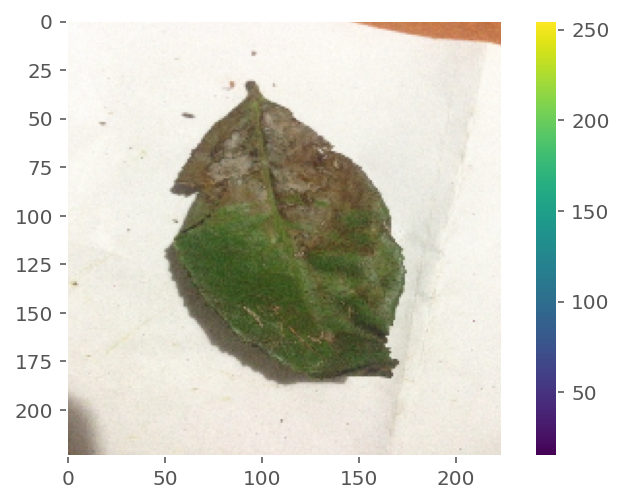



1/1 [==============================] - 0s 452ms/step
prediction: [[0.16141519 0.32316577 0.07034798 0.29774672 0.0397434  0.00133033
  0.0010976  0.10515296]]
true_class: red_leaf_spot 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/red_leaf_spot/UNADJUSTEDNONRAW_thumb_1c3.jpg


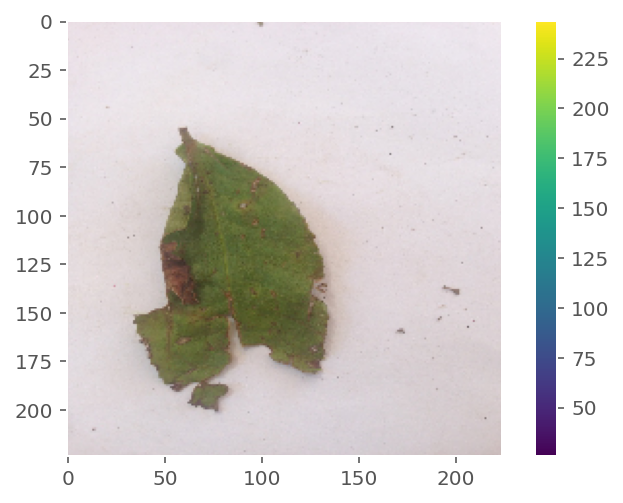



1/1 [==============================] - 0s 53ms/step
prediction: [[1.00863939e-02 1.15867816e-01 2.99907587e-02 7.45772421e-01
  1.52278421e-02 6.24970300e-04 3.00728309e-04 8.21290761e-02]]
true_class: brown_blight 
prediction_class: brown_blight 

real_img_path: /content/main_dataset/test/brown_blight/UNADJUSTEDNONRAW_thumb_10f.jpg


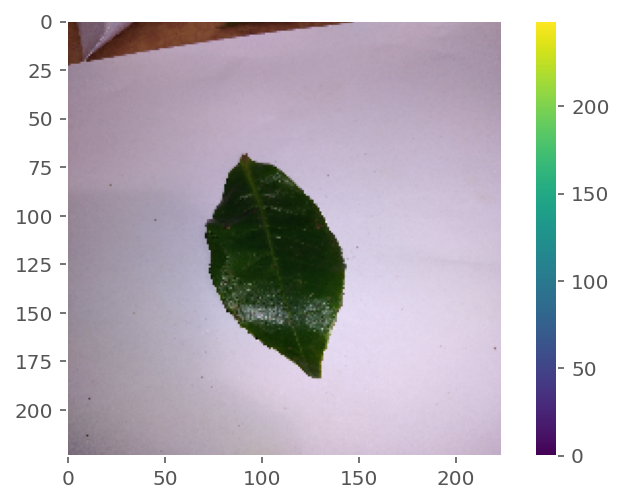



1/1 [==============================] - 0s 79ms/step
prediction: [[4.7944739e-04 1.4965369e-02 5.2551646e-03 1.4768392e-04 9.7865081e-01
  3.8238280e-04 8.9971218e-05 2.9195427e-05]]
true_class: gray_light 
prediction_class: gray_light 

real_img_path: /content/main_dataset/test/gray_light/IMG_20220503_135816.jpg


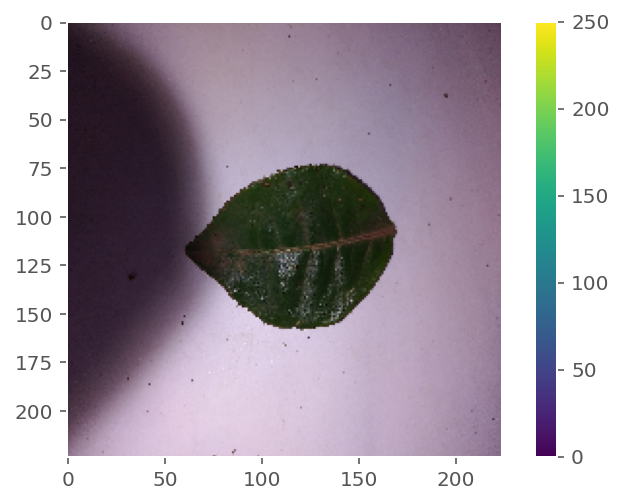



1/1 [==============================] - 0s 59ms/step
prediction: [[1.1210056e-04 1.3485524e-02 9.8011786e-01 1.0106405e-03 4.8619281e-03
  2.6309956e-04 8.2022190e-05 6.6786095e-05]]
true_class: bird_eye_spot 
prediction_class: bird_eye_spot 

real_img_path: /content/main_dataset/test/bird_eye_spot/IMG_20220503_155627.jpg


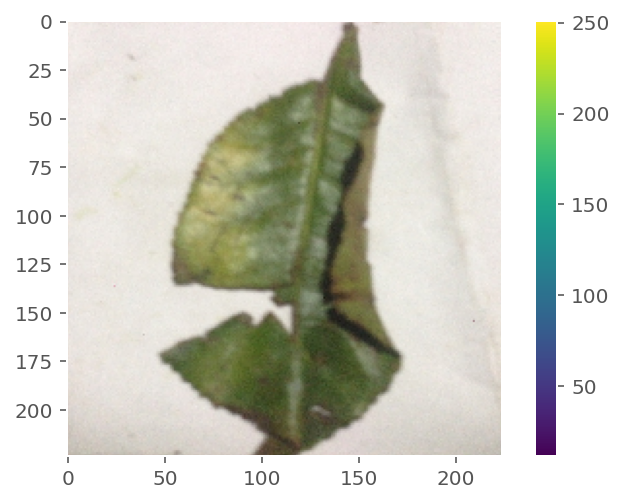



1/1 [==============================] - 0s 23ms/step
prediction: [[0.05187102 0.05414478 0.01582598 0.5438113  0.0078326  0.00078553
  0.00091888 0.3248099 ]]
true_class: red_leaf_spot 
prediction_class: brown_blight 

real_img_path: /content/main_dataset/test/red_leaf_spot/UNADJUSTEDNONRAW_thumb_1f6.jpg


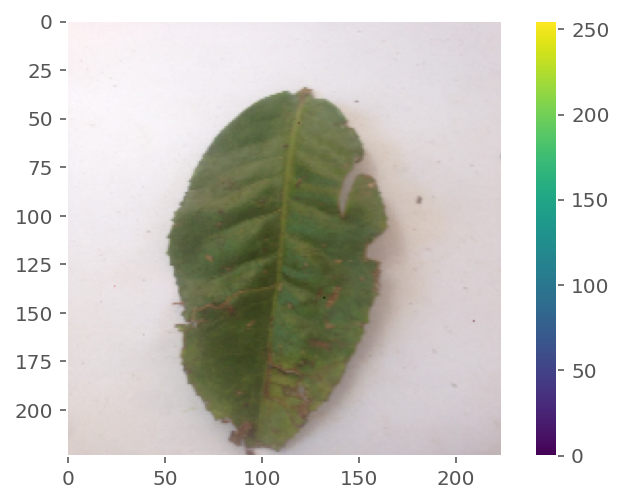



1/1 [==============================] - 0s 38ms/step
prediction: [[2.0111158e-02 2.1697830e-01 4.4306234e-02 5.9553546e-01 2.2522204e-02
  9.7549020e-04 4.5279533e-04 9.9118412e-02]]
true_class: white_spot 
prediction_class: brown_blight 

real_img_path: /content/main_dataset/test/white_spot/UNADJUSTEDNONRAW_thumb_d6.jpg


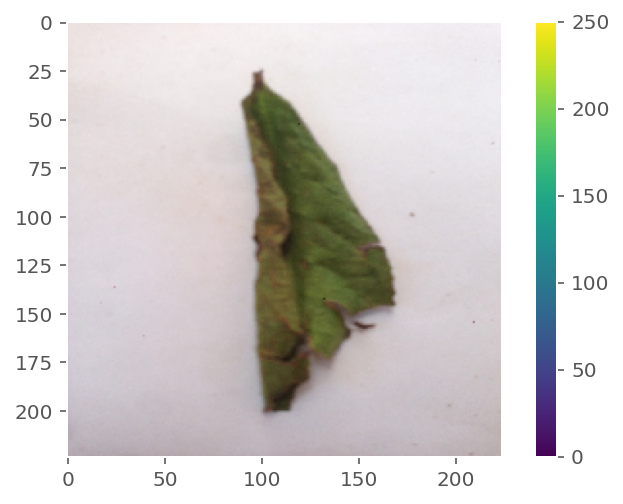



1/1 [==============================] - 0s 22ms/step
prediction: [[3.5578966e-02 8.1528568e-01 6.6457391e-02 3.2961693e-02 3.8776271e-02
  8.5783785e-04 2.3732195e-04 9.8448778e-03]]
true_class: algal_leaf 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_5e.jpg


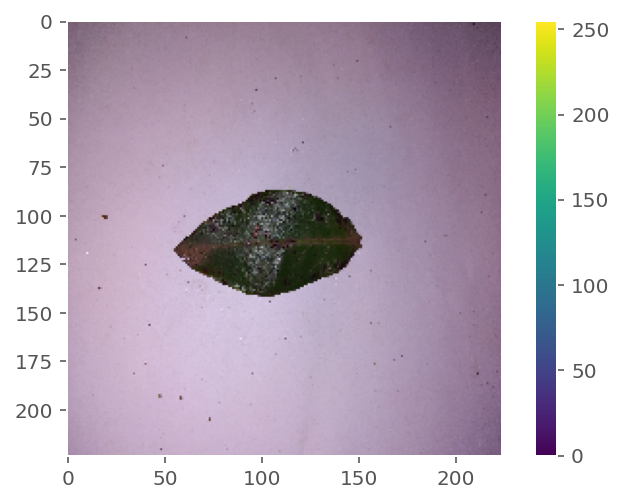



1/1 [==============================] - 0s 21ms/step
prediction: [[5.7373647e-05 1.2381308e-03 6.6881737e-04 1.8866145e-05 9.9774325e-01
  2.3884814e-04 3.1888569e-05 2.8320696e-06]]
true_class: bird_eye_spot 
prediction_class: gray_light 

real_img_path: /content/main_dataset/test/bird_eye_spot/IMG_20220503_155303.jpg


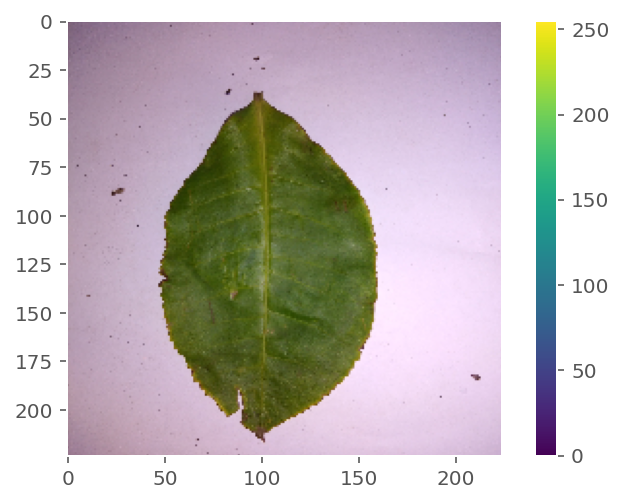



1/1 [==============================] - 0s 22ms/step
prediction: [[1.0447537e-05 3.8424297e-03 9.9108922e-01 2.3532539e-04 4.6397974e-03
  1.3658624e-04 3.1339037e-05 1.4762052e-05]]
true_class: anthracnose 
prediction_class: bird_eye_spot 

real_img_path: /content/main_dataset/test/anthracnose/IMG_20220503_144214.jpg


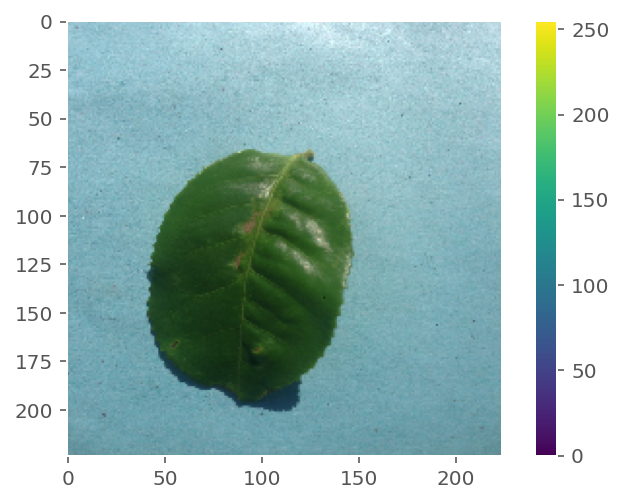



1/1 [==============================] - 0s 26ms/step
prediction: [[0.02443254 0.46371233 0.04771514 0.0022824  0.0509695  0.40707502
  0.00056938 0.00324378]]
true_class: healthy 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/healthy/UNADJUSTEDNONRAW_thumb_20d.jpg


In [30]:
for i in range(10):
    pred, y_hat, y, img_paths = tldi2_predict(model_1, test_dir, classes)

#### Training @2

In [44]:
def define_model_g2():
    augmentation = Sequential([
        keras.layers.RandomFlip("horizontal", input_shape=INPUT_SHAPE),
        keras.layers.RandomFlip("vertical"),
        keras.layers.RandomRotation(0.2),
        keras.layers.RandomZoom(0.2)
    ])

    model = Sequential([
        augmentation,
        keras.layers.Rescaling(1./255),
        Conv2D(64, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation="relu", kernel_initializer="he_uniform", padding="same"),
        MaxPooling2D((2, 2)),
        Dropout(0.5),
        Flatten(),
        Dense(64, activation="relu", kernel_initializer="he_uniform"),
        Dense(128, activation="relu", kernel_initializer="he_uniform"),
        BatchNormalization(),
        Dense(64, activation="relu", kernel_initializer="he_uniform"),
        BatchNormalization(),
        Dense(8, activation="softmax")
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(0.0005),
                  loss=keras.losses.CategoricalCrossentropy(),
                  metrics=[keras.metrics.CategoricalAccuracy()])
    
    print("\n")
    model.summary()
    print("\n")
    
    plot_model(model, to_file="model_architecture@2.png", show_shapes=True, show_layer_names=True)

    return model

In [46]:
model_2 = define_model_g2()
history_2 = model_2.fit(train,
                        validation_data=val,
                        epochs=200,
                        verbose=1,
                        callbacks=[checkpoint, acc_callback])



Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_10 (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 rescaling_5 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_20 (Conv2D)          (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 112, 112, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 112, 112, 64)      36928     
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 56, 56, 64)       0         
 g2D)                                              

6/6 [==============================] - 8s 1s/step - loss: 2.7607 - categorical_accuracy: 0.1246 - val_loss: 21.4524 - val_categorical_accuracy: 0.1287
Epoch 2/200
6/6 [==============================] - ETA: 0s - loss: 2.3698 - categorical_accuracy: 0.1714
Epoch 2: val_categorical_accuracy did not improve from 0.12871
6/6 [==============================] - 2s 444ms/step - loss: 2.3698 - categorical_accuracy: 0.1714 - val_loss: 21.2347 - val_categorical_accuracy: 0.1287
Epoch 3/200
6/6 [==============================] - ETA: 0s - loss: 2.0532 - categorical_accuracy: 0.2564
Epoch 3: val_categorical_accuracy did not improve from 0.12871
6/6 [==============================] - 2s 401ms/step - loss: 2.0532 - categorical_accuracy: 0.2564 - val_loss: 25.3147 - val_categorical_accuracy: 0.1287
Epoch 4/200
6/6 [==============================] - ETA: 0s - loss: 2.0294 - categorical_accuracy: 0.2847
Epoch 4: val_categorical_accuracy did not improve from 0.12871
6/6 [==============================] 

6/6 [==============================] - 6s 1s/step - loss: 1.7109 - categorical_accuracy: 0.3513 - val_loss: 8.9109 - val_categorical_accuracy: 0.1980
Epoch 7/200
6/6 [==============================] - ETA: 0s - loss: 1.5700 - categorical_accuracy: 0.3938
Epoch 7: val_categorical_accuracy did not improve from 0.19802
6/6 [==============================] - 2s 407ms/step - loss: 1.5700 - categorical_accuracy: 0.3938 - val_loss: 9.1300 - val_categorical_accuracy: 0.1980
Epoch 8/200
6/6 [==============================] - ETA: 0s - loss: 1.4965 - categorical_accuracy: 0.3867
Epoch 8: val_categorical_accuracy did not improve from 0.19802
6/6 [==============================] - 2s 447ms/step - loss: 1.4965 - categorical_accuracy: 0.3867 - val_loss: 6.9914 - val_categorical_accuracy: 0.1980
Epoch 9/200
6/6 [==============================] - ETA: 0s - loss: 1.4104 - categorical_accuracy: 0.4108
Epoch 9: val_categorical_accuracy did not improve from 0.19802
6/6 [==============================] - 2

6/6 [==============================] - 6s 1s/step - loss: 1.3596 - categorical_accuracy: 0.4462 - val_loss: 2.2282 - val_categorical_accuracy: 0.3564
Epoch 11/200
6/6 [==============================] - ETA: 0s - loss: 1.2669 - categorical_accuracy: 0.4561
Epoch 11: val_categorical_accuracy did not improve from 0.35644
6/6 [==============================] - 2s 402ms/step - loss: 1.2669 - categorical_accuracy: 0.4561 - val_loss: 1.8023 - val_categorical_accuracy: 0.3564
Epoch 12/200
6/6 [==============================] - ETA: 0s - loss: 1.3148 - categorical_accuracy: 0.4518
Epoch 12: val_categorical_accuracy did not improve from 0.35644
6/6 [==============================] - 2s 439ms/step - loss: 1.3148 - categorical_accuracy: 0.4518 - val_loss: 7.7548 - val_categorical_accuracy: 0.0693
Epoch 13/200
6/6 [==============================] - ETA: 0s - loss: 1.2630 - categorical_accuracy: 0.4504
Epoch 13: val_categorical_accuracy did not improve from 0.35644
6/6 [=============================

6/6 [==============================] - 6s 1s/step - loss: 1.0832 - categorical_accuracy: 0.5297 - val_loss: 1.5374 - val_categorical_accuracy: 0.3861
Epoch 17/200
6/6 [==============================] - ETA: 0s - loss: 1.0115 - categorical_accuracy: 0.5595
Epoch 17: val_categorical_accuracy improved from 0.38614 to 0.42574, saving model to /content


6/6 [==============================] - 6s 1s/step - loss: 1.0115 - categorical_accuracy: 0.5595 - val_loss: 1.5719 - val_categorical_accuracy: 0.4257
Epoch 18/200
6/6 [==============================] - ETA: 0s - loss: 0.9553 - categorical_accuracy: 0.5992
Epoch 18: val_categorical_accuracy did not improve from 0.42574
6/6 [==============================] - 2s 400ms/step - loss: 0.9553 - categorical_accuracy: 0.5992 - val_loss: 1.9185 - val_categorical_accuracy: 0.2772
Epoch 19/200
6/6 [==============================] - ETA: 0s - loss: 0.9001 - categorical_accuracy: 0.6190
Epoch 19: val_categorical_accuracy did not improve from 0.42574
6/6 [==============================] - 2s 440ms/step - loss: 0.9001 - categorical_accuracy: 0.6190 - val_loss: 1.8942 - val_categorical_accuracy: 0.3069
Epoch 20/200
6/6 [==============================] - ETA: 0s - loss: 0.8818 - categorical_accuracy: 0.6501
Epoch 20: val_categorical_accuracy improved from 0.42574 to 0.48515, saving model to /content


6/6 [==============================] - 6s 1s/step - loss: 0.8818 - categorical_accuracy: 0.6501 - val_loss: 1.0910 - val_categorical_accuracy: 0.4851
Epoch 21/200
6/6 [==============================] - ETA: 0s - loss: 0.9107 - categorical_accuracy: 0.6190
Epoch 21: val_categorical_accuracy did not improve from 0.48515
6/6 [==============================] - 2s 399ms/step - loss: 0.9107 - categorical_accuracy: 0.6190 - val_loss: 1.2087 - val_categorical_accuracy: 0.4851
Epoch 22/200
6/6 [==============================] - ETA: 0s - loss: 0.9719 - categorical_accuracy: 0.5850
Epoch 22: val_categorical_accuracy did not improve from 0.48515
6/6 [==============================] - 2s 400ms/step - loss: 0.9719 - categorical_accuracy: 0.5850 - val_loss: 3.0132 - val_categorical_accuracy: 0.1683
Epoch 23/200
6/6 [==============================] - ETA: 0s - loss: 0.9014 - categorical_accuracy: 0.6388
Epoch 23: val_categorical_accuracy improved from 0.48515 to 0.50495, saving model to /content


6/6 [==============================] - 6s 1s/step - loss: 0.9014 - categorical_accuracy: 0.6388 - val_loss: 1.2433 - val_categorical_accuracy: 0.5050
Epoch 24/200
6/6 [==============================] - ETA: 0s - loss: 0.8791 - categorical_accuracy: 0.6459
Epoch 24: val_categorical_accuracy did not improve from 0.50495
6/6 [==============================] - 2s 398ms/step - loss: 0.8791 - categorical_accuracy: 0.6459 - val_loss: 1.3708 - val_categorical_accuracy: 0.4752
Epoch 25/200
6/6 [==============================] - ETA: 0s - loss: 0.8034 - categorical_accuracy: 0.6742
Epoch 25: val_categorical_accuracy improved from 0.50495 to 0.62376, saving model to /content


6/6 [==============================] - 6s 1s/step - loss: 0.8034 - categorical_accuracy: 0.6742 - val_loss: 1.0458 - val_categorical_accuracy: 0.6238
Epoch 26/200
6/6 [==============================] - ETA: 0s - loss: 0.7979 - categorical_accuracy: 0.6671
Epoch 26: val_categorical_accuracy did not improve from 0.62376
6/6 [==============================] - 2s 442ms/step - loss: 0.7979 - categorical_accuracy: 0.6671 - val_loss: 1.4669 - val_categorical_accuracy: 0.3861
Epoch 27/200
6/6 [==============================] - ETA: 0s - loss: 0.7108 - categorical_accuracy: 0.7280
Epoch 27: val_categorical_accuracy did not improve from 0.62376
6/6 [==============================] - 2s 404ms/step - loss: 0.7108 - categorical_accuracy: 0.7280 - val_loss: 1.4543 - val_categorical_accuracy: 0.3960
Epoch 28/200
6/6 [==============================] - ETA: 0s - loss: 0.7117 - categorical_accuracy: 0.7125
Epoch 28: val_categorical_accuracy did not improve from 0.62376
6/6 [=============================

6/6 [==============================] - 6s 1s/step - loss: 0.4371 - categorical_accuracy: 0.8300 - val_loss: 0.9163 - val_categorical_accuracy: 0.6733
Epoch 52/200
6/6 [==============================] - ETA: 0s - loss: 0.4195 - categorical_accuracy: 0.8314
Epoch 52: val_categorical_accuracy did not improve from 0.67327
6/6 [==============================] - 2s 392ms/step - loss: 0.4195 - categorical_accuracy: 0.8314 - val_loss: 1.4590 - val_categorical_accuracy: 0.5050
Epoch 53/200
6/6 [==============================] - ETA: 0s - loss: 0.4002 - categorical_accuracy: 0.8499
Epoch 53: val_categorical_accuracy improved from 0.67327 to 0.73267, saving model to /content


6/6 [==============================] - 6s 1s/step - loss: 0.4002 - categorical_accuracy: 0.8499 - val_loss: 0.6868 - val_categorical_accuracy: 0.7327
Epoch 54/200
6/6 [==============================] - ETA: 0s - loss: 0.3976 - categorical_accuracy: 0.8414
Epoch 54: val_categorical_accuracy did not improve from 0.73267
6/6 [==============================] - 2s 396ms/step - loss: 0.3976 - categorical_accuracy: 0.8414 - val_loss: 1.4913 - val_categorical_accuracy: 0.4851
Epoch 55/200
6/6 [==============================] - ETA: 0s - loss: 0.3758 - categorical_accuracy: 0.8414
Epoch 55: val_categorical_accuracy did not improve from 0.73267
6/6 [==============================] - 2s 397ms/step - loss: 0.3758 - categorical_accuracy: 0.8414 - val_loss: 1.4742 - val_categorical_accuracy: 0.4752
Epoch 56/200
6/6 [==============================] - ETA: 0s - loss: 0.3607 - categorical_accuracy: 0.8725
Epoch 56: val_categorical_accuracy did not improve from 0.73267
6/6 [=============================

6/6 [==============================] - 6s 1s/step - loss: 0.3810 - categorical_accuracy: 0.8499 - val_loss: 0.5466 - val_categorical_accuracy: 0.7525
Epoch 63/200
6/6 [==============================] - ETA: 0s - loss: 0.3888 - categorical_accuracy: 0.8484
Epoch 63: val_categorical_accuracy did not improve from 0.75248
6/6 [==============================] - 2s 402ms/step - loss: 0.3888 - categorical_accuracy: 0.8484 - val_loss: 1.0076 - val_categorical_accuracy: 0.6634
Epoch 64/200
6/6 [==============================] - ETA: 0s - loss: 0.3609 - categorical_accuracy: 0.8584
Epoch 64: val_categorical_accuracy improved from 0.75248 to 0.76238, saving model to /content


6/6 [==============================] - 6s 1s/step - loss: 0.3609 - categorical_accuracy: 0.8584 - val_loss: 0.6408 - val_categorical_accuracy: 0.7624
Epoch 65/200
6/6 [==============================] - ETA: 0s - loss: 0.3421 - categorical_accuracy: 0.8725
Epoch 65: val_categorical_accuracy did not improve from 0.76238
6/6 [==============================] - 2s 401ms/step - loss: 0.3421 - categorical_accuracy: 0.8725 - val_loss: 1.2985 - val_categorical_accuracy: 0.6040
Epoch 66/200
6/6 [==============================] - ETA: 0s - loss: 0.3727 - categorical_accuracy: 0.8527
Epoch 66: val_categorical_accuracy did not improve from 0.76238
6/6 [==============================] - 2s 399ms/step - loss: 0.3727 - categorical_accuracy: 0.8527 - val_loss: 1.0146 - val_categorical_accuracy: 0.6139
Epoch 67/200
6/6 [==============================] - ETA: 0s - loss: 0.3721 - categorical_accuracy: 0.8640
Epoch 67: val_categorical_accuracy did not improve from 0.76238
6/6 [=============================

6/6 [==============================] - 6s 1s/step - loss: 0.3430 - categorical_accuracy: 0.8697 - val_loss: 0.5737 - val_categorical_accuracy: 0.7921
Epoch 69/200
6/6 [==============================] - ETA: 0s - loss: 0.3409 - categorical_accuracy: 0.8754
Epoch 69: val_categorical_accuracy did not improve from 0.79208
6/6 [==============================] - 2s 400ms/step - loss: 0.3409 - categorical_accuracy: 0.8754 - val_loss: 0.6428 - val_categorical_accuracy: 0.7921
Epoch 70/200
6/6 [==============================] - ETA: 0s - loss: 0.3008 - categorical_accuracy: 0.8895
Epoch 70: val_categorical_accuracy did not improve from 0.79208
6/6 [==============================] - 2s 396ms/step - loss: 0.3008 - categorical_accuracy: 0.8895 - val_loss: 1.0179 - val_categorical_accuracy: 0.6238
Epoch 71/200
6/6 [==============================] - ETA: 0s - loss: 0.3188 - categorical_accuracy: 0.8810
Epoch 71: val_categorical_accuracy did not improve from 0.79208
6/6 [=============================

6/6 [==============================] - 6s 1s/step - loss: 0.3132 - categorical_accuracy: 0.8839 - val_loss: 0.5652 - val_categorical_accuracy: 0.8020
Epoch 75/200
6/6 [==============================] - ETA: 0s - loss: 0.3124 - categorical_accuracy: 0.8895
Epoch 75: val_categorical_accuracy did not improve from 0.80198
6/6 [==============================] - 2s 400ms/step - loss: 0.3124 - categorical_accuracy: 0.8895 - val_loss: 0.7330 - val_categorical_accuracy: 0.7624
Epoch 76/200
6/6 [==============================] - ETA: 0s - loss: 0.3229 - categorical_accuracy: 0.8796
Epoch 76: val_categorical_accuracy did not improve from 0.80198
6/6 [==============================] - 2s 397ms/step - loss: 0.3229 - categorical_accuracy: 0.8796 - val_loss: 1.4070 - val_categorical_accuracy: 0.5446
Epoch 77/200
6/6 [==============================] - ETA: 0s - loss: 0.3412 - categorical_accuracy: 0.8612
Epoch 77: val_categorical_accuracy did not improve from 0.80198
6/6 [=============================

6/6 [==============================] - 6s 1s/step - loss: 0.3018 - categorical_accuracy: 0.8824 - val_loss: 0.4424 - val_categorical_accuracy: 0.8614
Epoch 82/200
6/6 [==============================] - ETA: 0s - loss: 0.2896 - categorical_accuracy: 0.8867
Epoch 82: val_categorical_accuracy did not improve from 0.86139
6/6 [==============================] - 2s 405ms/step - loss: 0.2896 - categorical_accuracy: 0.8867 - val_loss: 0.5413 - val_categorical_accuracy: 0.8218
Epoch 83/200
6/6 [==============================] - ETA: 0s - loss: 0.2786 - categorical_accuracy: 0.8994
Epoch 83: val_categorical_accuracy did not improve from 0.86139
6/6 [==============================] - 2s 402ms/step - loss: 0.2786 - categorical_accuracy: 0.8994 - val_loss: 0.6850 - val_categorical_accuracy: 0.6931
Epoch 84/200
6/6 [==============================] - ETA: 0s - loss: 0.2672 - categorical_accuracy: 0.9051
Epoch 84: val_categorical_accuracy did not improve from 0.86139
6/6 [=============================

#### Quick Eval @2

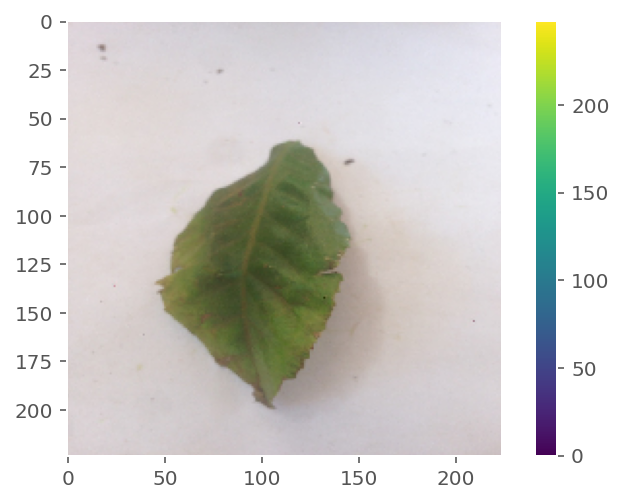



1/1 [==============================] - 0s 229ms/step
prediction: [[1.0752442e-04 4.0502488e-04 8.5870153e-04 7.6838231e-01 6.6249748e-05
  2.0148852e-04 1.4447619e-04 2.2983420e-01]]
true_class: brown_blight 
prediction_class: brown_blight 

real_img_path: /content/main_dataset/test/brown_blight/UNADJUSTEDNONRAW_thumb_134.jpg


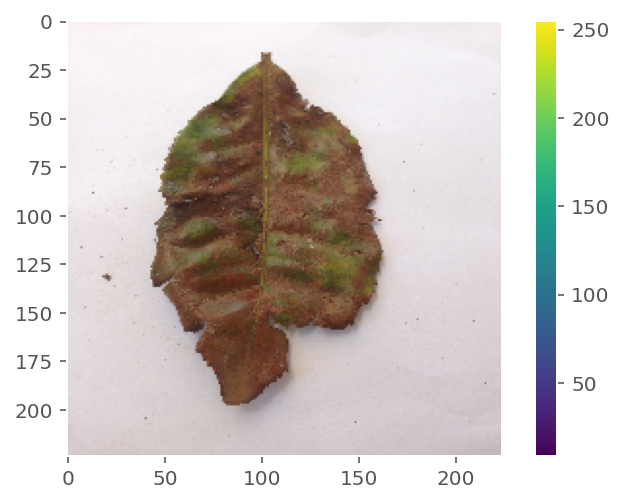



1/1 [==============================] - 0s 18ms/step
prediction: [[9.92575288e-01 4.02755424e-04 1.83306591e-04 6.16584392e-03
  5.70860575e-05 1.02699254e-04 8.77251568e-06 5.04270080e-04]]
true_class: algal_leaf 
prediction_class: algal_leaf 

real_img_path: /content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_28.jpg


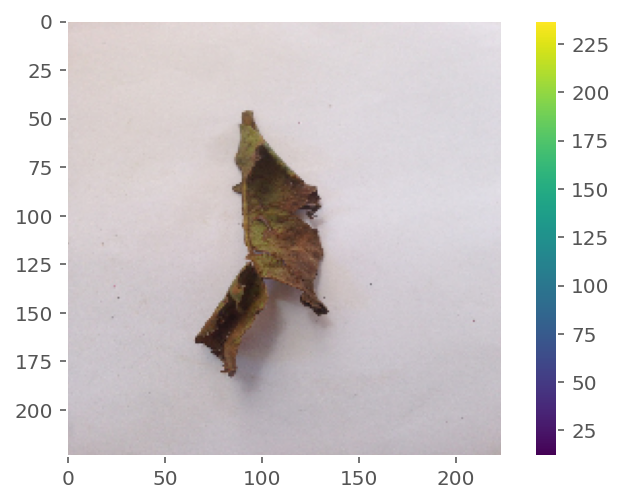



1/1 [==============================] - 0s 27ms/step
prediction: [[9.8691338e-01 2.9644200e-03 8.2596834e-04 3.7674359e-03 1.0028919e-03
  4.1212275e-04 1.1415507e-03 2.9722573e-03]]
true_class: algal_leaf 
prediction_class: algal_leaf 

real_img_path: /content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_2f.jpg


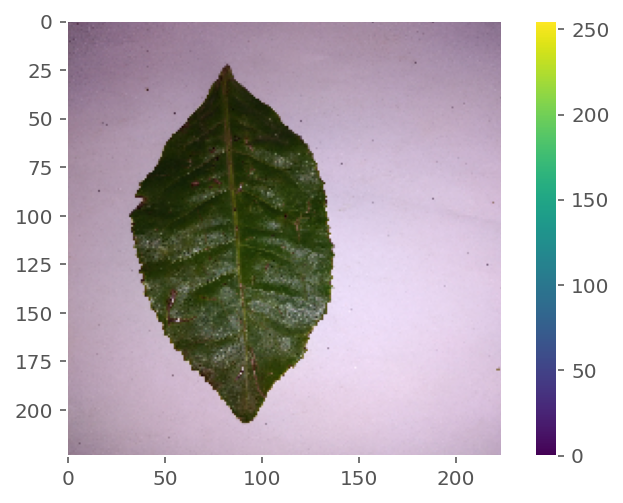



1/1 [==============================] - 0s 28ms/step
prediction: [[3.78129625e-05 2.15598345e-02 9.76575077e-01 4.00749632e-05
  1.61624514e-03 1.06108666e-04 5.85725647e-05 6.30537716e-06]]
true_class: bird_eye_spot 
prediction_class: bird_eye_spot 

real_img_path: /content/main_dataset/test/bird_eye_spot/IMG_20220503_160558.jpg


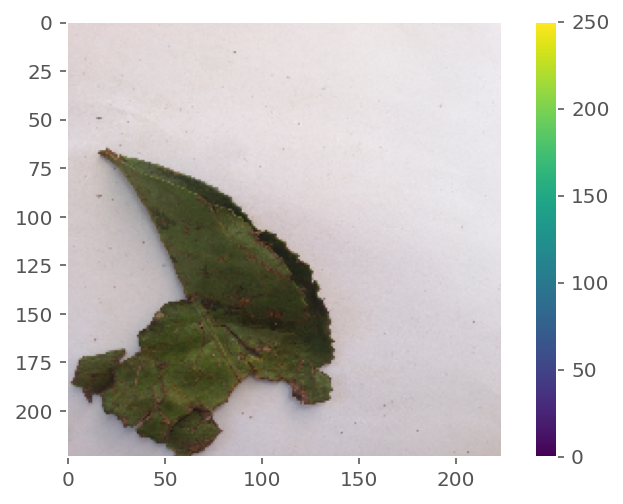



1/1 [==============================] - 0s 22ms/step
prediction: [[0.7898341  0.05628655 0.01580379 0.01146513 0.01391122 0.00573697
  0.03191055 0.07505172]]
true_class: algal_leaf 
prediction_class: algal_leaf 

real_img_path: /content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_59.jpg


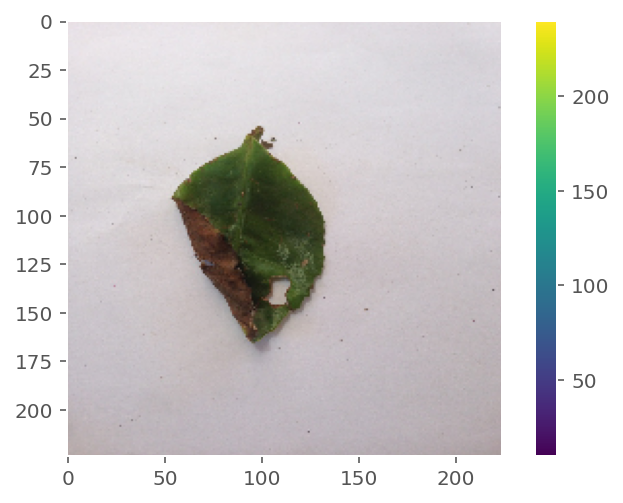



1/1 [==============================] - 0s 24ms/step
prediction: [[0.9251352  0.03105424 0.00980984 0.00406698 0.00590178 0.00139608
  0.00232495 0.020311  ]]
true_class: algal_leaf 
prediction_class: algal_leaf 

real_img_path: /content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_16.jpg


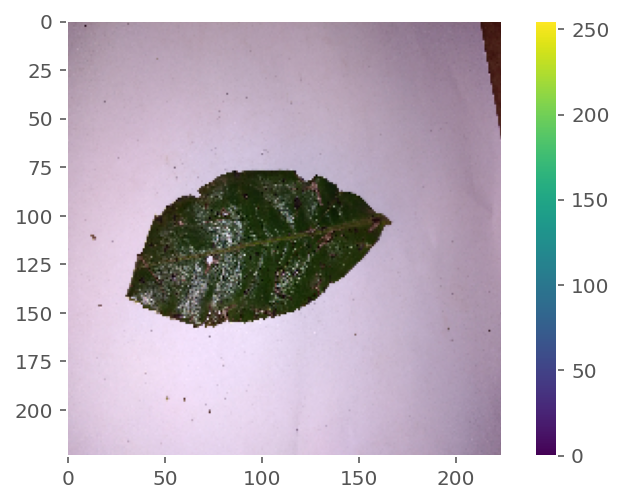



1/1 [==============================] - 0s 24ms/step
prediction: [[1.00792364e-04 8.25667903e-02 4.82934900e-02 6.61863771e-04
  8.66223872e-01 2.04602210e-03 1.00793615e-04 6.40530789e-06]]
true_class: bird_eye_spot 
prediction_class: gray_light 

real_img_path: /content/main_dataset/test/bird_eye_spot/IMG_20220503_155227.jpg


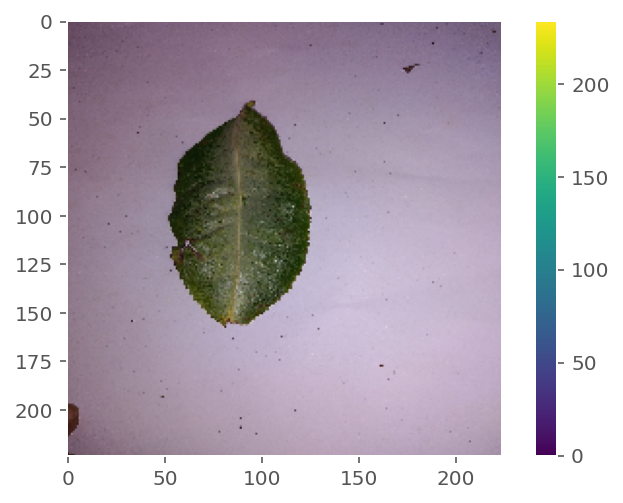



1/1 [==============================] - 0s 25ms/step
prediction: [[2.1165075e-04 6.2338668e-01 3.4394017e-01 9.2015765e-04 2.8920991e-02
  8.9327659e-04 1.6562237e-03 7.0835871e-05]]
true_class: anthracnose 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/anthracnose/IMG_20220503_145227.jpg


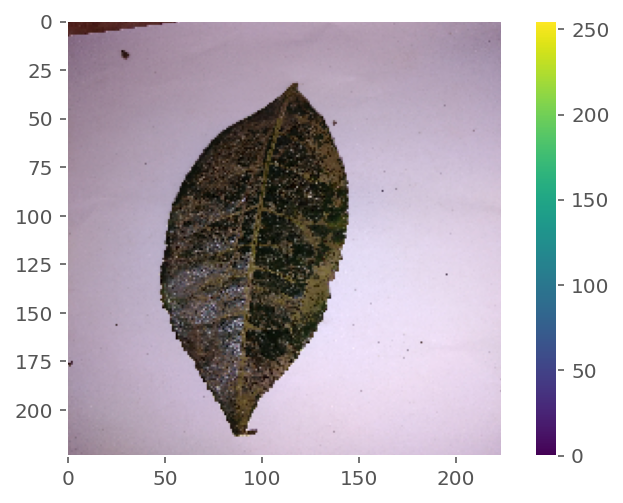



1/1 [==============================] - 0s 25ms/step
prediction: [[3.6217592e-05 9.1598940e-01 8.9827977e-04 4.1661973e-04 8.2048170e-02
  6.0654036e-04 1.2607135e-06 3.4894067e-06]]
true_class: anthracnose 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/anthracnose/IMG_20220503_143433.jpg


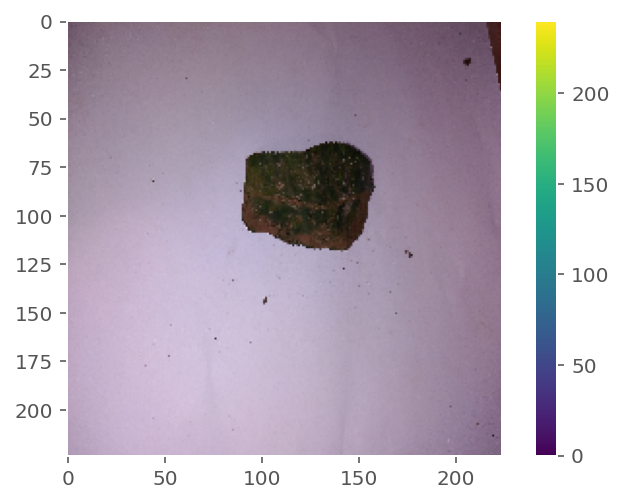



1/1 [==============================] - 0s 27ms/step
prediction: [[5.09116391e-04 9.30228293e-01 1.87552925e-02 1.60814880e-03
  4.80303653e-02 3.17270722e-04 4.41831799e-04 1.09735054e-04]]
true_class: anthracnose 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/anthracnose/IMG_20220503_143604.jpg


In [47]:
for i in range(10):
    pred, y_hat, y, img_paths = tldi2_predict(model_2, test_dir, classes)

In [48]:
model_2.save("tldi2_g2.h5")

In [49]:
export_dir = "tldi2v1_g2/"
tf.saved_model.save(model_2, export_dir)

In [51]:
with zipfile.ZipFile("tldi2v1_g2.zip", "w", zipfile.ZIP_DEFLATED) as zipf:
    zipdir(os.path.join(os.getcwd(), export_dir), zipf)

### ResNet50 and ResNet152V2 

In [59]:
def resnet152v2():
    base_model = ResNet152V2(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))
    base_model.trainable = False

    main_model = Sequential([
        base_model,
        Dropout(0.6),
        Flatten(),
        Dense(256, activation="relu", kernel_initializer="he_uniform"),
        Dense(8, activation="softmax")
    ])
    
    main_model.compile(optimizer=SGD(learning_rate=0.0005), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy()])

    print("\n")
    main_model.summary()
    print("\n")
    plot_model(main_model, to_file="model_architecture_resnet152.png", show_shapes=True, show_layer_names=True)

    return main_model

In [60]:
model_3 = resnet152v2()

history_3 = model_3.fit(train,
                        validation_data=val,
                        epochs=200,
                        verbose=1,
                        callbacks=[acc_callback, reduce_lr])



Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 7, 7, 2048)        58331648  
                                                                 
 dropout_22 (Dropout)        (None, 7, 7, 2048)        0         
                                                                 
 flatten_7 (Flatten)         (None, 100352)            0         
                                                                 
 dense_26 (Dense)            (None, 256)               25690368  
                                                                 
 dense_27 (Dense)            (None, 8)                 2056      
                                                                 
Total params: 84,024,072
Trainable params: 25,692,424
Non-trainable params: 58,331,648
_________________________________________________________________


Epoch 1/200
6/6 [===========

KeyboardInterrupt: ignored

In [52]:
from keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

In [66]:
def resnet50():
    base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3), classes=8)
    base_model.trainable = False

    pt = Input(shape=(224, 224, 3))
    func = tf.cast(pt, tf.float32)
    x = preprocess_input(func)

    model = base_model(x, training=False)
    model = GlobalAveragePooling2D()(model)
    model = Dense(256, activation="relu")(model)
    model = Dense(8, activation="softmax")(model)

    main_model = Model(inputs=pt, outputs=model)
    
    main_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy()])

    print("\n")
    main_model.summary()
    print("\n")
    plot_model(main_model, to_file="model_architecture_resnet.png", show_shapes=True, show_layer_names=True)

    return main_model

In [67]:
class AccuracyCallback50(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
        if(logs.get("categorical_accuracy")>0.99):
            self.model.stop_training = True

resnet50_acc = AccuracyCallback50()

In [68]:
model_4 = resnet50()

history_4 = model_4.fit(train,
                        validation_data=val,
                        epochs=200,
                        verbose=1,
                        callbacks=[resnet50_acc])



Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 tf.cast_3 (TFOpLambda)      (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_3   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_3 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0 

#### Quick Eval

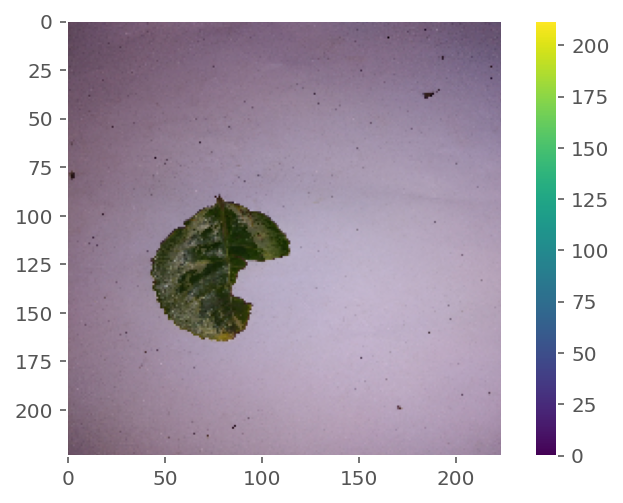



1/1 [==============================] - 1s 1s/step
prediction: [[7.9814697e-07 9.5326501e-01 6.1940691e-03 2.0916050e-06 4.0535189e-02
  6.4817891e-07 1.9150807e-06 3.9012335e-07]]
true_class: anthracnose 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/anthracnose/IMG_20220503_145559.jpg


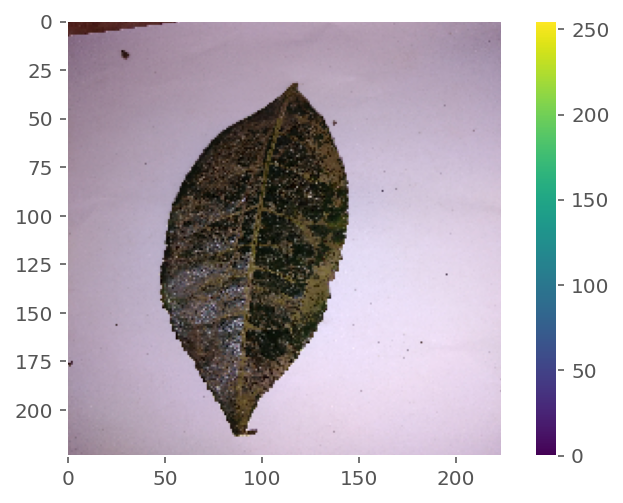



1/1 [==============================] - 0s 25ms/step
prediction: [[1.73343069e-05 9.80034590e-01 1.20032495e-02 3.42921354e-08
  7.16791814e-03 2.60038432e-05 7.50308973e-04 5.67746440e-07]]
true_class: anthracnose 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/anthracnose/IMG_20220503_143433.jpg


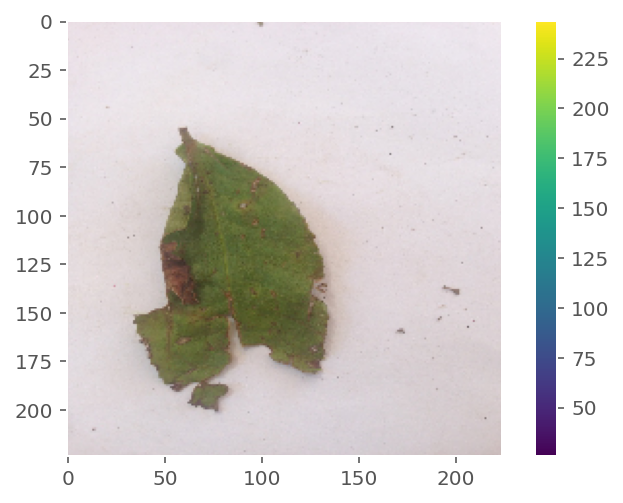



1/1 [==============================] - 0s 29ms/step
prediction: [[2.4691848e-02 3.6519079e-03 2.4344054e-05 3.2960981e-01 1.5551048e-04
  3.6041922e-05 1.4295801e-02 6.2753475e-01]]
true_class: brown_blight 
prediction_class: white_spot 

real_img_path: /content/main_dataset/test/brown_blight/UNADJUSTEDNONRAW_thumb_10f.jpg


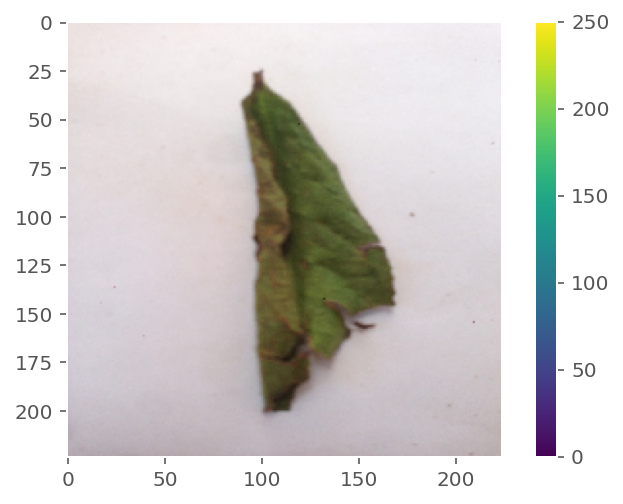



1/1 [==============================] - 0s 23ms/step
prediction: [[9.2225778e-01 2.1358475e-04 1.4389526e-06 5.4078422e-02 1.5752530e-05
  2.1508276e-03 1.3343379e-02 7.9387436e-03]]
true_class: algal_leaf 
prediction_class: algal_leaf 

real_img_path: /content/main_dataset/test/algal_leaf/UNADJUSTEDNONRAW_thumb_5e.jpg


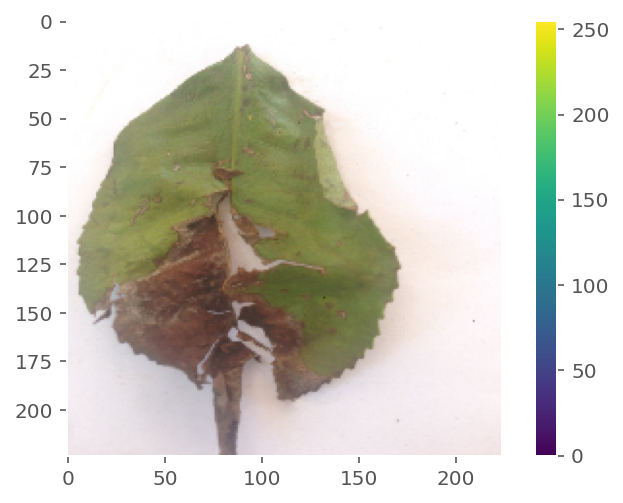



1/1 [==============================] - 0s 39ms/step
prediction: [[1.1828789e-02 2.0121099e-04 5.3807395e-07 9.8705405e-01 2.5483270e-05
  6.2133577e-06 1.9190350e-04 6.9170113e-04]]
true_class: brown_blight 
prediction_class: brown_blight 

real_img_path: /content/main_dataset/test/brown_blight/UNADJUSTEDNONRAW_thumb_11c.jpg


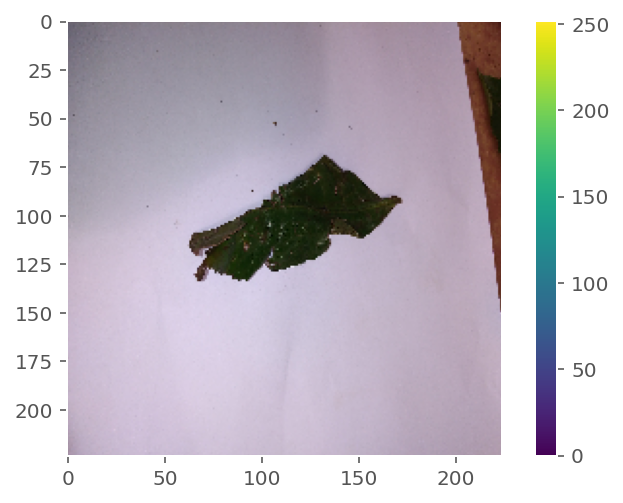



1/1 [==============================] - 0s 27ms/step
prediction: [[1.13105642e-07 4.99571033e-04 1.45841213e-05 2.98828513e-06
  9.99471843e-01 2.91486089e-08 1.09546645e-05 5.52416646e-09]]
true_class: gray_light 
prediction_class: gray_light 

real_img_path: /content/main_dataset/test/gray_light/IMG_20220503_135500.jpg


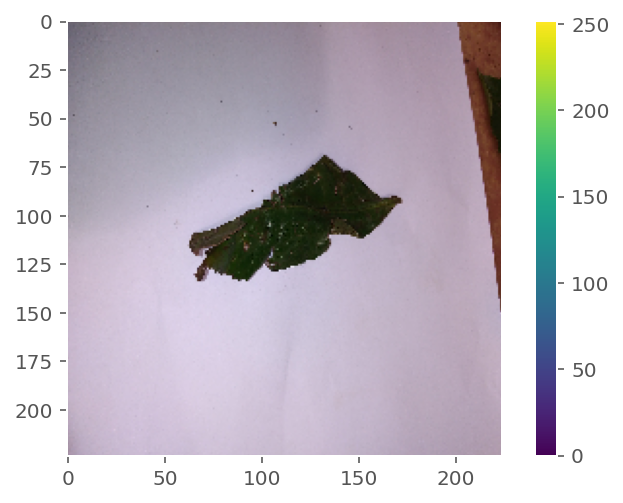



1/1 [==============================] - 0s 34ms/step
prediction: [[1.13105642e-07 4.99571033e-04 1.45841213e-05 2.98828513e-06
  9.99471843e-01 2.91486089e-08 1.09546645e-05 5.52416646e-09]]
true_class: gray_light 
prediction_class: gray_light 

real_img_path: /content/main_dataset/test/gray_light/IMG_20220503_135500.jpg


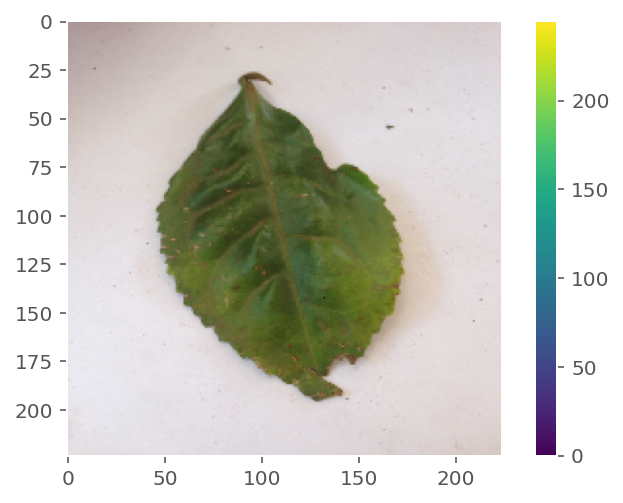



1/1 [==============================] - 0s 39ms/step
prediction: [[7.9930788e-03 3.0961851e-04 1.1474813e-04 5.1171724e-02 1.2028713e-04
  1.7799644e-04 7.5619704e-05 9.4003689e-01]]
true_class: white_spot 
prediction_class: white_spot 

real_img_path: /content/main_dataset/test/white_spot/UNADJUSTEDNONRAW_thumb_be.jpg


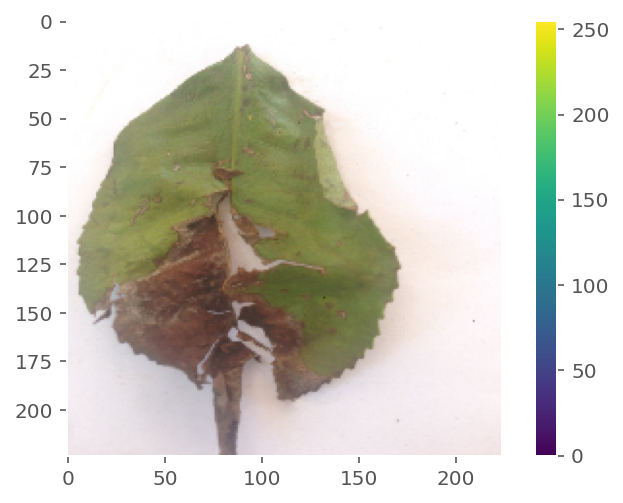



1/1 [==============================] - 0s 33ms/step
prediction: [[1.1828789e-02 2.0121099e-04 5.3807395e-07 9.8705405e-01 2.5483270e-05
  6.2133577e-06 1.9190350e-04 6.9170113e-04]]
true_class: brown_blight 
prediction_class: brown_blight 

real_img_path: /content/main_dataset/test/brown_blight/UNADJUSTEDNONRAW_thumb_11c.jpg


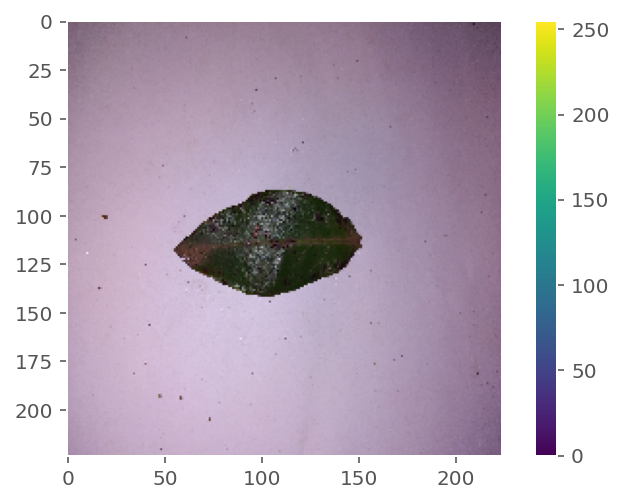



1/1 [==============================] - 0s 34ms/step
prediction: [[1.33815604e-07 7.81375706e-01 2.16776878e-01 8.85631124e-08
  1.84342661e-03 1.79459477e-07 3.48681601e-06 1.13963516e-07]]
true_class: bird_eye_spot 
prediction_class: anthracnose 

real_img_path: /content/main_dataset/test/bird_eye_spot/IMG_20220503_155303.jpg


In [69]:
for i in range(10):
    pred, y_hat, y, img_paths = tldi2_predict(model_4, test_dir, classes)

In [70]:
model_4.save("tldi2_resnet50.h5")